In [29]:
import requests            # for web crawling
from io import StringIO    # read and write strings as files
import pandas as pd
import numpy as np
from datetime import datetime, timedelta, timezone, date   # get current time
from dateutil.relativedelta import relativedelta  # offset days or months
import matplotlib.pyplot as plt   # to plot
import csv     # to export our dataframes as CSV files
import pytz    # get datetime in certain timezone (World Timezone Definitions for Python)

In [30]:
weekend = set([5, 6])                   # define weekends
offset = 1
def date_generator(offset, now):        # get dates and convert a datetime object to string
    now = now - timedelta(days=offset)
    while now.weekday() in weekend:
        now = now - timedelta(days=1)   # skip weekends
    date_str = datetime.strftime(now,'%Y-%m-%d')
    date_str = date_str.replace("-","") # turn dates to strings
    print("date_str=",date_str)
    return now, date_str
# date_generator(1,now)


<font color=#0055ff size=6>Stock Screening (Step1)</font><br>
<font color=#002200 size=4>Screen out most stocks, only pick those both domestic institution investors (DIIs) and foreign institutional investors (FIIs) have bought within the last 5 days from today.</font>
<br>
<font color=#555555 size=4>(The information is available in public view for every investor on the daily basis)</font>
<br>

In [31]:
def replace_comma(value):               # remove commas in our data
    temp = ""
    value = str(value)
    if ',' in value:
        temp = value[0:len(value)-3].replace(',', '')
    else:
        temp = value
    return temp

def dataframe_generator(date_str):
    # crawl data from TWSE (Taiwan Stock Exchange Corporation)
    r2 = requests.get('http://www.tse.com.tw/fund/T86?response=csv&date='+date_str+'&selectType=ALLBUT0999') 
    df2 = pd.read_csv(StringIO(r2.text), header=1).dropna(how='all', axis=1).dropna(how='any')
    df2 = df2[['證券代號','證券名稱','外陸資買賣超股數(不含外資自營商)', '投信買賣超股數']]
    # units that DII & FII have bought in a given date 
    col = ["投信買賣超股數","外陸資買賣超股數(不含外資自營商)"]
    # remove commas and convert strings to integers
    df2[col] = df2[col].applymap(replace_comma).astype(int)
    # only keep those both DII and FII has bought within recent 5 days
    df2 = df2.loc[(df2["外陸資買賣超股數(不含外資自營商)"] > 0) | (df2["投信買賣超股數"] > 0)] 
    df2['外資投信同買天數'] = 0
    df2.loc[(df2["外陸資買賣超股數(不含外資自營商)"] > 0) & (df2["投信買賣超股數"] > 0), '外資投信同買天數'] = 1
#    df2 = df2.loc[df2['證券代號'].str.len() < 5]            # uncomment this line if you want to delete ETF
    return df2
#dataframe_generator(date_generator(1,now)[1])

In [32]:
df_list = []
now = datetime.now(pytz.timezone('Asia/Taipei'))  # get current local time in Taiwan (need to import pytz first)
while len(df_list) < 5:                           # append dataframes to df_list within recent five days
    now, date_str = date_generator(offset, now)
    df_list.append(dataframe_generator(date_str))
# concatenate dataframes within the last 5 days from today
new_df = pd.concat(df_list, axis=0)                 
# delete the stocks that shows Foreign Investment Institution and Domestic Institution haven't both both bought
new_df = new_df.loc[new_df["外資投信同買天數"] > 0]  

date_str= 20181214
date_str= 20181213
date_str= 20181212
date_str= 20181211
date_str= 20181210


In [33]:
grouped = new_df.groupby(['證券代號','證券名稱'], as_index=False).agg({"外陸資買賣超股數(不含外資自營商)":"sum","投信買賣超股數":"sum","外資投信同買天數":"sum"})
# sort the picked stocks in an ascending order according to the number of days both FII and DII have bought 
result = grouped.sort_values("外資投信同買天數", ascending = False) 
result['證券代號'] = result['證券代號'].str.replace('=','').str.replace('"','')
display(result)
c = np.array(result['證券代號'])     # save stock ID's in an array

,證券代號,證券名稱,外陸資買賣超股數(不含外資自營商),投信買賣超股數,外資投信同買天數
134,5876,上海商銀,5259,1885,5
52,2409,友達,8559,40,4
130,5434,崇越,241,170,4
32,2301,光寶科,9050,95,4
21,1722,台肥,1228,340,4
133,5871,中租-KY,845,27,4
111,3665,貿聯-KY,1276,185,4
158,8210,勤誠,322,265,4
54,2439,美律,721,839,3
125,5234,達興材料,459,732,3


<br>
<font color=#0055ff size=6>Stock Screening (Step2)</font><br>
<font color=#002200 size=4>Use an EMA system that involves 5-day, 20-day, 50-day and 100-day EMAs：</font><br>
<font color=#002200 size=3>．Pick stocks whose prices are in uptrend (EMA5 > EMA20 > EMA50 > EMA100) </font><br>
<font color=#002200 size=3>．The slope of EMA20, EMA50 and EMA100 should be greater than 0</font>
<br>

In [34]:
# get data within recent 6 months
def date_split(month_len):
    res = []
    now = datetime.now(pytz.timezone('Asia/Taipei'))
    for i in range(month_len):  
        date_temp = datetime.strftime(now - relativedelta(months=+i),'%Y-%m')
        date1 = date_temp.split("-")
        res.append(date1)
    return res         # export the date in the last 6 months
def to_df(df,month):
    res_df = df[0][1:]
    res_df.columns = res_df.iloc[0]
    res_df = res_df.iloc[1:].reset_index(drop=True)
    res_df = res_df.loc[res_df["日期"].str.len() < 11] # filter out blank dataframes
    res_df = res_df.loc[res_df["日期"].str.split('/').str[1] == month]
    return res_df
def load_df(x,month_len):
    # crawl data from the website: https://stock.wearn.com
    df_list=[]
    months = len(date_split(month_len))
    for i in range(months):
        url = 'https://stock.wearn.com/cdata.asp?Year='+str(int(date_split(month_len)[i][0])-1911)+'&month='+date_split(month_len)[i][1]+'&kind='+ x
        df01 = pd.read_html(url)
        res_df01 = to_df(df01,date_split(month_len)[i][1])
        df_list.append(res_df01)
    return pd.concat(df_list, ignore_index=True)
date_split(6) 

[['2018', '12'],
 ['2018', '11'],
 ['2018', '10'],
 ['2018', '09'],
 ['2018', '08'],
 ['2018', '07']]

5876
2409
5434
2301


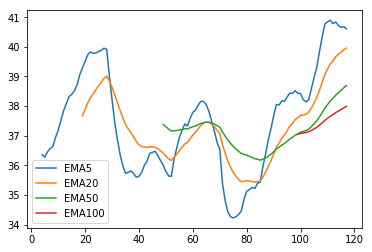

1722


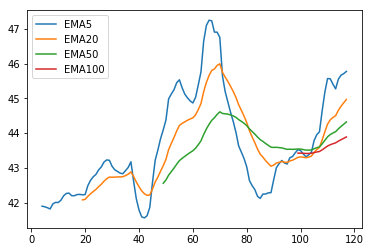

5871
3665


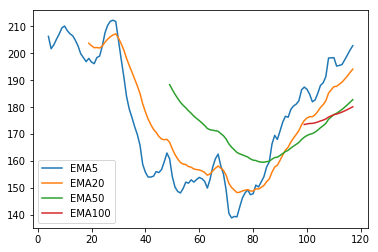

8210


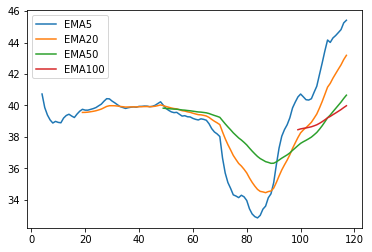

2439
5234
8112
2458


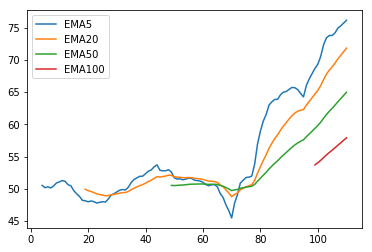

1532


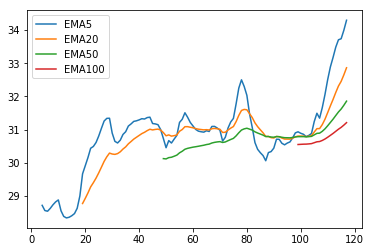

3005
6416
2345
1434
3231
6285


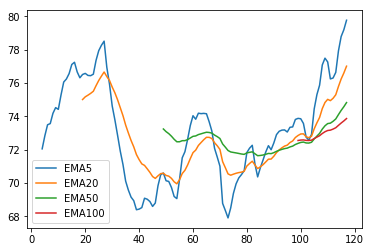

3596
3481
2610


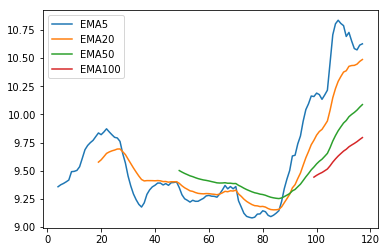

3533
2501


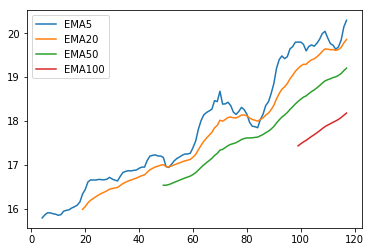

2524


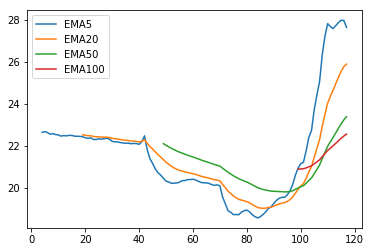

6176
2385
2606
4977
5288


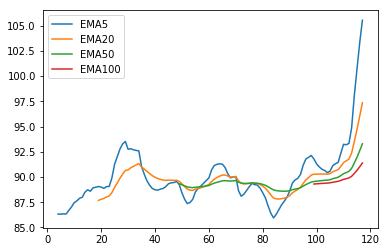

1201
3501
3406
3338


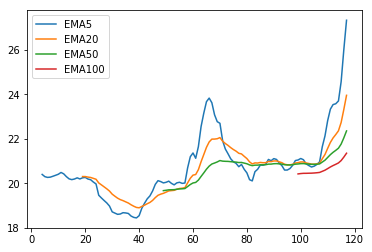

3042
3037


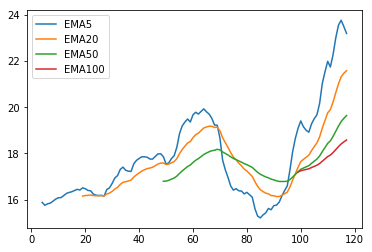

3034
2912
2617
2887
4958


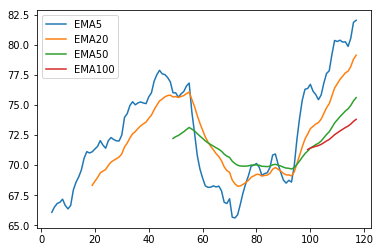

2812
2809
2382
5269
6269
3515
2227
2317
2206
8081
1723
8163
8028
8016


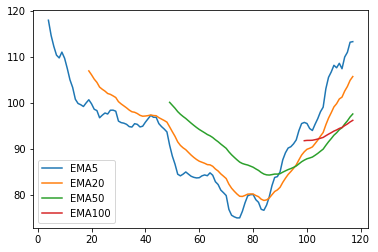

2312
2023
8114
1310


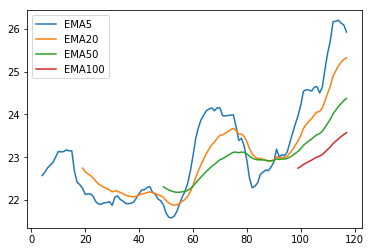

2328
1227
6409
8213
1216
1515


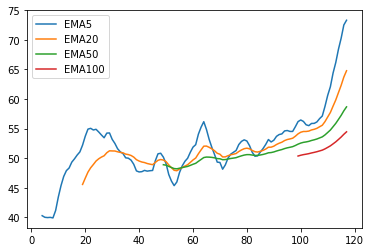

4190
3706
3703


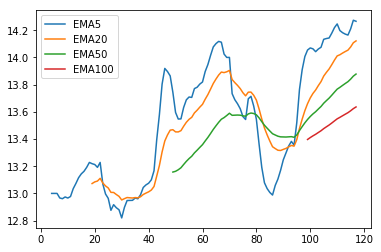

8464
3711
6271


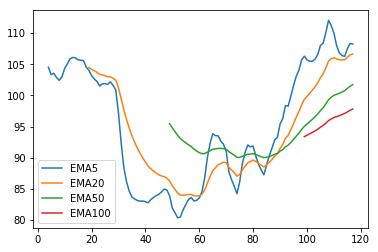

8499


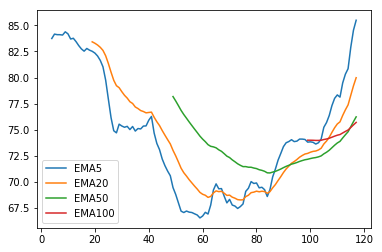

3698
9904
4552
9914
3645
3605
9921


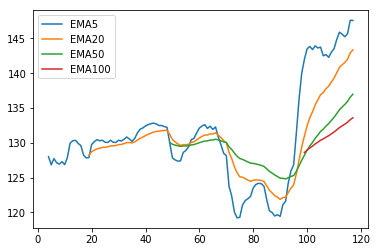

9940
3545
9945


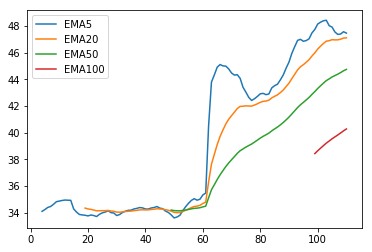

8422
4938
8271
5522
6230
6278


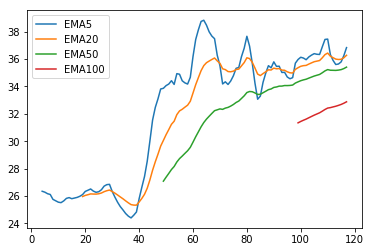

6166
6005
5880
6456
6552


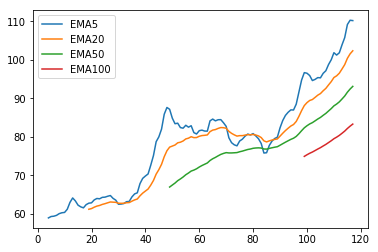

5534
8046


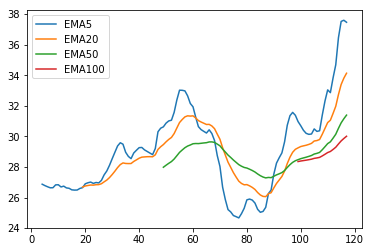

4746
5388
8110
5243
8150
6277
4915
4912
4766
1102
3006
3532
3450
2383
2379


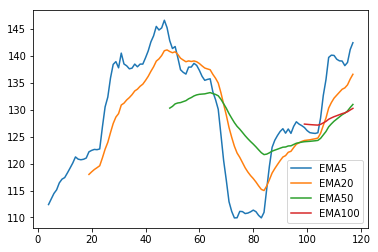

2354
2353
2352
2331
2330
2324
2313
2308


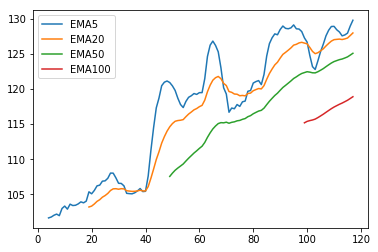

2231
2228
2207
2049
1802
1773
1717
1605
1604
1558
1537
1527
1477
1476
1455
1319
1316
1314
1215
2392
2393
2404


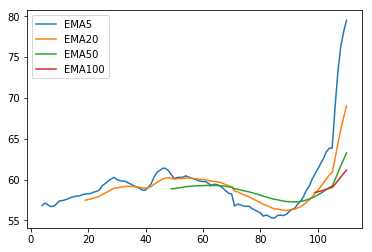

2883
3443
3189
3059
3045
3041
3028
3026
3016
3008
2915


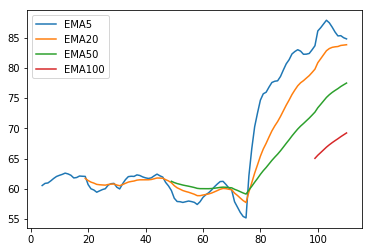

2891
2886
2885
2834


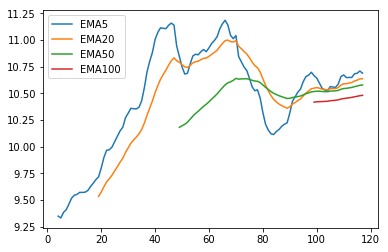

2412
2820
2801
2727


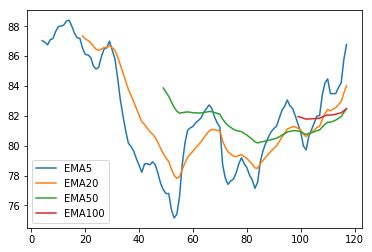

2636


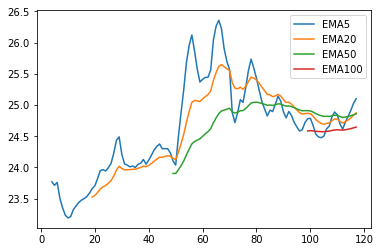

2633
2615
2614
2542
2527
2520
2488
2449
2448
00636


In [35]:
import talib # for calculating exponential moving average. This API cannot be installed by using the 'pip' command
def MA(xxx):
    EMA5 = talib.EMA(xxx,5)
    EMA20 = talib.EMA(xxx,20)
    EMA50 = talib.EMA(xxx,50)
    EMA100 = talib.EMA(xxx,100)
#    print("EMA5[-1]",EMA5[-1],"EMA20[-1]",EMA20[-1],"EMA50[-1]", EMA50[-1],"EMA100[-1]",EMA100[-1], "EMA20[-2]",EMA20[-2],"EMA50[-2]",EMA50[-2],"EMA100[-2]",EMA100[-2])
    if EMA5[-1] > EMA20[-1] and EMA20[-1] > EMA50[-1] and EMA50[-1] >EMA100[-1] and EMA20[-1] > EMA20[-2] and EMA50[-1] > EMA50[-2] and EMA100[-1] > EMA100[-2]:
# EMA5 > EMA20 > EMA50 > EMA100 , and the slope of EMA20, EMA50 and EMA100 must be positive
        plt.plot(EMA5)
        plt.plot(EMA20)
        plt.plot(EMA50)
        plt.plot(EMA100)
        plt.gca().legend(('EMA5','EMA20','EMA50','EMA100'))
 # plot and see if the EMAs satisfy the stock screening criteria
        plt.show()
        return True
    else:
        return False
res_list= []
df_res = []
for x in c:
    print(x)
    load = pd.DataFrame()
# load data within recent 6 months from https://stock.wearn.com
    load = load_df(x,6)   
    xxx = np.array(load['收盤價'],dtype=float)[::-1] 
# Check if 
    if MA(xxx):
        res_list.append(x)
        df_res.append(load)

In [36]:
# Show the stocks we've picked
for i in range(len(res_list)):
    print(res_list[i])
#    display(df_res[i])
print(str(len(res_list)) + " items")

2301
1722
3665
8210
2458
1532
6285
2610
2501
2524
5288
3338
3037
4958
8016
1310
1515
3703
6271
8499
9921
9945
6278
6552
8046
2379
2308
2404
2915
2834
2727
2636
32 items


<font color=#990011 size=6>Backtesting:</font><br>
<font color=#002200 size=5>Use a modified double crossover method instead. Follow a set of criteria：</font><br>
<font color=#00aa00 size=4>．Buy：</font><br>
<font color=#009988 size=3>ⅰ. stock price > short EMA<br></font>
<font color=#009988 size=3>ⅱ. slope of short and long EMA > 0<br></font>
<font color=#009988 size=3>ⅲ. ( short EMA / long EMA ) > 1.02<br></font>
<font color=#009988 size=3>ⅳ. current price > EMA50<br></font>
<font color=#00aa00 size=4>．Sell：</font><br>
<font color=#009988 size=3> slope of short EMA < 0 </font> <font color=#aa0088 size=3>(when there is a pullback)<br></font>
or <br>
<font color=#009988 size=3>( slope of short EMA > 0 and trading volume > 2.2*(yesterday’s) )</font> <font color=#aa0088 size=3>(when there is a volume surge)<br></font>

In [37]:
#crawl data within the last two years (24 months) from https://stock.wearn.com, very time-consuming
backtest_df = []
for i in res_list:
    backtest_temp = load_df(i,24)
    backtest_df.append(backtest_temp)
    backtest_temp.to_csv(str(i)+'.csv',sep=',',encoding='utf-8')
    display(backtest_temp)

1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,40.25,40.70,40.25,40.45,4274
1,107/12/13,40.35,40.75,40.10,40.75,6835
2,107/12/12,40.85,40.90,40.40,40.50,7336
3,107/12/11,40.05,40.65,39.90,40.50,6612
4,107/12/10,39.60,40.95,39.60,40.95,6112
5,107/12/07,40.90,41.00,40.50,40.55,4832
6,107/12/06,40.90,41.00,39.85,41.00,6282
7,107/12/05,40.95,41.30,40.55,41.00,4888
8,107/12/04,41.25,41.80,40.90,41.65,11192
9,107/12/03,40.95,41.30,40.90,41.30,8703


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,45.95,46.05,45.65,45.90,1818
1,107/12/13,46.30,46.35,45.55,45.80,1955
2,107/12/12,46.20,46.50,45.90,45.90,2511
3,107/12/11,45.15,46.20,45.15,46.10,1929
4,107/12/10,45.00,45.65,44.65,45.00,2110
5,107/12/07,45.65,45.70,45.00,45.10,3521
6,107/12/06,46.35,46.40,45.15,45.55,3850
7,107/12/05,45.70,46.45,45.70,46.35,3465
8,107/12/04,45.95,46.75,45.95,46.25,5505
9,107/12/03,45.00,46.10,45.00,45.85,7371


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,210.00,211.00,205.00,206.00,2687
1,107/12/13,206.00,210.50,205.00,205.00,2356
2,107/12/12,204.50,207.50,202.50,203.00,2485
3,107/12/11,199.00,204.50,198.00,201.00,2640
4,107/12/10,191.00,196.50,191.00,196.50,1489
5,107/12/07,193.50,197.00,193.00,196.00,2762
6,107/12/06,201.00,202.50,187.00,189.00,4949
7,107/12/05,194.00,204.00,192.00,198.50,4142
8,107/12/04,213.00,216.00,198.50,198.50,4997
9,107/12/03,202.00,215.00,201.00,212.00,5290


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,46.85,46.85,45.50,45.75,578
1,107/12/13,45.00,46.55,45.00,46.10,920
2,107/12/12,44.95,45.30,44.70,45.20,382
3,107/12/11,44.75,45.70,44.70,45.00,571
4,107/12/10,44.65,44.75,43.85,44.75,582
5,107/12/07,46.00,46.00,44.00,44.85,1246
6,107/12/06,45.55,46.00,42.65,43.70,948
7,107/12/05,44.50,45.65,44.35,45.55,604
8,107/12/04,44.15,45.35,44.00,45.00,773
9,107/12/03,45.20,45.80,43.85,44.15,1439


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,76.70,77.30,76.00,77.00,2391
1,107/12/13,76.70,77.50,75.60,76.60,4999
2,107/12/12,77.80,77.90,75.20,76.00,4224
3,107/12/11,73.70,76.40,73.70,76.40,4369
4,107/12/10,73.10,75.00,73.10,75.00,2619
5,107/12/07,75.30,76.00,73.50,73.80,3376
6,107/12/06,76.40,77.10,73.50,74.50,4759
7,107/12/05,74.60,77.80,74.10,75.60,5398
8,107/12/04,74.90,78.30,74.90,75.90,10986
9,107/12/03,71.30,73.80,71.30,73.00,5754


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,34.20,34.95,34.10,34.90,1377
1,107/12/13,34.10,34.95,34.00,34.50,3304
2,107/12/12,34.15,34.35,33.70,33.80,813
3,107/12/11,34.40,34.80,33.90,34.15,1535
4,107/12/10,33.70,34.15,33.40,34.10,1092
5,107/12/07,33.95,34.40,33.25,33.75,1266
6,107/12/06,33.60,34.05,32.65,33.65,2448
7,107/12/05,32.50,33.40,32.30,33.40,1519
8,107/12/04,32.30,32.85,32.20,32.85,999
9,107/12/03,32.15,32.70,32.00,32.30,1537


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,81.00,82.10,79.20,80.90,6036
1,107/12/13,80.90,81.70,79.10,80.00,4870
2,107/12/12,80.30,81.40,79.60,80.50,6803
3,107/12/11,78.10,80.50,78.10,80.50,8383
4,107/12/10,76.40,78.00,75.70,77.30,3465
5,107/12/07,75.50,77.30,75.30,76.40,2390
6,107/12/06,76.90,77.60,73.60,74.20,3700
7,107/12/05,77.10,77.40,76.10,76.80,2514
8,107/12/04,79.50,79.50,78.20,78.30,2657
9,107/12/03,78.40,80.50,77.50,79.50,5986


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,10.65,10.80,10.55,10.65,9743
1,107/12/13,10.60,10.70,10.60,10.70,7884
2,107/12/12,10.50,10.60,10.45,10.55,7426
3,107/12/11,10.50,10.60,10.40,10.45,12306
4,107/12/10,10.65,10.70,10.40,10.50,12955
5,107/12/07,10.65,10.85,10.60,10.80,12637
6,107/12/06,10.75,10.75,10.30,10.50,21477
7,107/12/05,10.65,10.85,10.60,10.75,10421
8,107/12/04,10.85,10.95,10.60,10.75,27265
9,107/12/03,11.25,11.35,10.80,10.90,26417


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,20.75,21.00,20.55,20.60,1708
1,107/12/13,20.35,20.75,20.25,20.75,2539
2,107/12/12,19.80,20.20,19.70,20.15,1194
3,107/12/11,19.75,19.95,19.65,19.80,746
4,107/12/10,19.55,19.55,19.40,19.45,349
5,107/12/07,19.55,19.65,19.45,19.65,462
6,107/12/06,19.60,19.65,19.30,19.50,1121
7,107/12/05,19.80,19.95,19.60,19.60,1126
8,107/12/04,20.30,20.30,19.90,20.15,1193
9,107/12/03,20.25,20.30,20.10,20.25,978


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,27.75,27.80,26.70,27.00,603
1,107/12/13,27.90,28.25,27.90,27.95,307
2,107/12/12,28.45,28.50,27.85,28.20,513
3,107/12/11,28.50,29.00,27.90,28.20,1145
4,107/12/10,27.75,29.50,27.60,28.00,1911
5,107/12/07,27.80,28.40,27.40,27.40,762
6,107/12/06,29.55,29.55,26.65,27.40,1582
7,107/12/05,28.80,30.30,28.05,29.00,1939
8,107/12/04,29.05,30.75,28.10,29.00,2729
9,107/12/03,26.90,28.95,26.20,28.95,2790


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,109.00,110.50,107.00,110.00,1695
1,107/12/13,107.00,111.00,105.50,108.50,3814
2,107/12/12,105.50,107.00,103.50,106.00,2416
3,107/12/11,100.00,106.50,99.80,104.50,3883
4,107/12/10,94.40,98.30,93.80,98.00,1151
5,107/12/07,95.50,96.40,93.60,93.60,842
6,107/12/06,94.60,96.80,93.00,93.10,595
7,107/12/05,94.50,99.40,94.50,95.00,2414
8,107/12/04,92.50,94.40,91.70,94.20,575
9,107/12/03,92.00,93.40,91.40,91.70,133


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,28.90,30.00,28.45,29.95,10912
1,107/12/13,27.80,28.90,27.30,28.90,12919
2,107/12/12,24.20,26.30,24.10,26.30,4317
3,107/12/11,24.00,24.10,23.35,23.95,486
4,107/12/10,23.60,24.10,23.35,23.65,661
5,107/12/07,24.45,25.15,23.85,23.95,1767
6,107/12/06,24.30,24.80,23.20,24.35,2300
7,107/12/05,22.40,24.20,22.40,24.20,1426
8,107/12/04,23.25,24.15,22.85,23.10,2108
9,107/12/03,21.50,23.25,21.50,23.00,1538


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,23.10,23.55,22.50,22.60,71656
1,107/12/13,23.80,23.80,22.90,22.95,72836
2,107/12/12,25.30,25.35,23.70,24.20,76028
3,107/12/11,25.00,25.10,24.25,24.65,86960
4,107/12/10,23.40,25.10,23.40,24.45,150621
5,107/12/07,21.55,23.35,21.55,23.35,80198
6,107/12/06,23.00,23.50,20.90,21.25,64131
7,107/12/05,21.90,22.90,21.90,22.90,30864
8,107/12/04,22.50,23.10,21.95,22.55,50321
9,107/12/03,22.00,23.00,21.95,22.75,71263


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,84.50,84.70,81.40,82.40,6798
1,107/12/13,84.00,84.80,83.00,84.50,12775
2,107/12/12,80.20,82.00,80.20,81.90,5403
3,107/12/11,80.00,80.70,78.80,79.10,3961
4,107/12/10,78.60,80.90,78.10,80.30,5341
5,107/12/07,81.80,82.50,79.80,79.90,6899
6,107/12/06,79.30,80.80,78.50,80.60,9235
7,107/12/05,80.70,81.20,79.80,80.10,5663
8,107/12/04,82.90,83.30,81.50,82.70,10316
9,107/12/03,79.90,82.10,79.80,81.90,13546


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,116.50,118.50,113.50,113.50,2446
1,107/12/13,115.50,119.00,114.50,117.50,5388
2,107/12/12,116.00,118.50,113.00,113.00,2895
3,107/12/11,107.50,115.00,106.00,115.00,4359
4,107/12/10,107.50,111.50,102.00,105.00,2602
5,107/12/07,110.00,115.00,110.00,110.50,4999
6,107/12/06,109.50,112.50,104.50,106.50,2051
7,107/12/05,106.00,112.00,104.00,111.00,2951
8,107/12/04,112.50,114.00,108.00,109.00,2989
9,107/12/03,115.00,116.00,108.00,110.50,4771


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,26.10,26.15,25.45,25.60,3546
1,107/12/13,26.25,26.25,25.75,26.00,2527
2,107/12/12,26.50,26.55,25.70,26.00,5290
3,107/12/11,26.50,26.85,26.25,26.25,3258
4,107/12/10,26.90,27.35,25.90,26.20,9812
5,107/12/07,26.45,28.50,26.45,27.05,24565
6,107/12/06,26.20,26.60,25.65,26.30,10601
7,107/12/05,25.60,26.35,25.60,26.20,9198
8,107/12/04,25.15,26.20,25.00,25.90,19421
9,107/12/03,24.60,25.10,24.30,24.90,7756


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,76.30,77.70,73.90,74.90,9135
1,107/12/13,73.10,77.00,72.50,77.00,14711
2,107/12/12,73.20,77.50,71.70,74.00,25543
3,107/12/11,69.20,73.00,68.70,72.90,12002
4,107/12/10,67.90,70.10,67.00,69.70,10416
5,107/12/07,65.70,69.50,65.20,69.00,16603
6,107/12/06,64.50,66.40,62.00,65.00,15446
7,107/12/05,60.10,64.80,60.00,64.30,15916
8,107/12/04,58.00,62.00,58.00,62.00,14098
9,107/12/03,58.30,60.00,58.00,58.00,8619


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,14.40,14.40,14.25,14.25,423
1,107/12/13,14.35,14.45,14.20,14.40,1372
2,107/12/12,14.15,14.35,14.15,14.30,1080
3,107/12/11,14.05,14.15,14.05,14.15,970
4,107/12/10,14.10,14.15,14.00,14.15,478
5,107/12/07,14.20,14.25,14.15,14.15,411
6,107/12/06,14.25,14.25,14.05,14.10,726
7,107/12/05,14.15,14.35,14.15,14.30,497
8,107/12/04,14.30,14.35,14.25,14.30,878
9,107/12/03,14.25,14.30,14.20,14.25,1160


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,109.00,110.00,107.50,108.00,949
1,107/12/13,110.50,111.00,108.00,110.00,1178
2,107/12/12,106.50,111.50,106.50,110.00,1925
3,107/12/11,105.50,106.50,104.50,106.00,527
4,107/12/10,102.50,106.00,102.50,105.50,1243
5,107/12/07,105.00,106.50,103.50,104.50,1140
6,107/12/06,107.50,109.00,104.00,104.00,1149
7,107/12/05,106.00,109.00,105.50,107.50,1762
8,107/12/04,116.50,117.00,109.50,109.50,3337
9,107/12/03,114.50,120.50,114.50,116.00,3670


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,88.10,88.50,86.10,87.40,49
1,107/12/13,87.00,89.90,86.50,87.80,149
2,107/12/12,82.40,87.30,82.00,87.00,159
3,107/12/11,80.50,83.00,80.50,81.90,38
4,107/12/10,81.70,86.50,80.50,82.00,178
5,107/12/07,78.80,83.10,78.80,82.20,147
6,107/12/06,79.00,79.00,77.60,77.70,40
7,107/12/05,78.90,79.00,78.50,79.00,30
8,107/12/04,79.00,79.50,79.00,79.40,18
9,107/12/03,78.00,79.40,77.50,79.20,64


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,151.00,151.00,147.00,147.50,1186
1,107/12/13,148.50,152.50,147.00,151.50,2083
2,107/12/12,145.50,147.50,144.50,146.50,1171
3,107/12/11,145.50,150.00,144.50,144.50,2597
4,107/12/10,146.00,148.00,143.50,145.00,1176
5,107/12/07,147.50,152.50,144.50,148.00,2895
6,107/12/06,145.00,148.00,143.00,147.50,2026
7,107/12/05,142.00,146.00,141.00,144.50,1401
8,107/12/04,143.00,146.50,140.50,144.50,1219
9,107/12/03,145.00,145.50,140.00,141.50,1138


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,47.65,47.80,47.20,47.25,720
1,107/12/13,47.50,47.90,47.40,47.90,913
2,107/12/12,47.00,47.60,47.00,47.45,919
3,107/12/11,47.00,47.60,46.95,47.00,866
4,107/12/10,47.20,47.65,46.70,46.80,843
5,107/12/07,47.45,47.85,47.45,47.70,926
6,107/12/06,48.55,48.60,47.15,47.20,1915
7,107/12/05,47.40,48.70,47.40,48.50,1441
8,107/12/04,48.50,49.20,48.40,48.60,1644
9,107/12/03,49.00,49.55,48.55,48.55,2180


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,36.95,38.40,36.60,38.00,8647
1,107/12/13,36.10,38.50,35.90,37.15,14219
2,107/12/12,36.00,36.90,35.90,36.10,3859
3,107/12/11,35.50,36.35,35.30,35.70,3785
4,107/12/10,34.15,35.35,34.10,35.00,3299
5,107/12/07,34.80,35.35,34.40,35.05,4276
6,107/12/06,37.30,37.75,33.85,34.05,12349
7,107/12/05,37.50,38.30,37.10,37.50,6463
8,107/12/04,38.00,40.15,37.70,38.50,21615
9,107/12/03,37.05,38.55,36.85,38.00,10647


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,113.00,116.00,110.00,110.00,2135
1,107/12/13,116.00,116.00,110.50,112.50,2401
2,107/12/12,112.00,117.00,110.00,116.00,3959
3,107/12/11,111.00,113.00,107.00,109.50,4627
4,107/12/10,102.50,108.00,101.00,108.00,3657
5,107/12/07,103.00,107.00,101.00,103.00,4276
6,107/12/06,102.50,107.50,99.50,100.00,4137
7,107/12/05,100.00,105.50,98.50,105.50,2584
8,107/12/04,103.00,105.50,100.00,102.50,2269
9,107/12/03,100.50,107.50,99.00,102.00,4402


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,37.00,37.65,36.15,37.20,24076
1,107/12/13,39.00,39.40,37.70,37.75,25292
2,107/12/12,42.00,42.40,39.00,39.65,36458
3,107/12/11,37.40,40.00,37.15,40.00,38721
4,107/12/10,35.40,39.15,35.30,36.40,39051
5,107/12/07,33.10,35.75,32.70,35.75,18205
6,107/12/06,33.90,34.65,32.10,32.50,10960
7,107/12/05,33.50,35.45,33.30,34.50,17186
8,107/12/04,33.55,35.60,32.90,34.15,23434
9,107/12/03,31.80,33.45,31.30,33.45,22996


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,145.50,147.00,140.50,145.00,3535
1,107/12/13,140.50,147.00,140.50,146.00,5233
2,107/12/12,139.00,140.00,137.00,140.00,1590
3,107/12/11,141.00,142.50,136.00,136.50,2252
4,107/12/10,135.00,139.50,135.00,139.00,1148
5,107/12/07,139.50,141.00,137.50,138.50,2243
6,107/12/06,139.00,140.00,135.50,138.00,3804
7,107/12/05,137.50,142.00,135.50,140.00,2988
8,107/12/04,147.50,148.00,141.00,141.00,4382
9,107/12/03,145.00,151.00,145.00,148.00,6033


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,130.00,132.00,129.50,131.50,7400
1,107/12/13,130.00,131.50,129.00,131.00,12036
2,107/12/12,129.50,129.50,128.00,128.50,3977
3,107/12/11,127.00,129.50,127.00,128.00,5199
4,107/12/10,126.00,128.00,126.00,126.50,2775
5,107/12/07,127.50,127.50,126.50,127.50,1576
6,107/12/06,128.50,128.50,125.00,127.50,7610
7,107/12/05,128.00,129.50,127.50,129.00,2978
8,107/12/04,130.00,130.00,128.00,130.00,7152
9,107/12/03,131.00,131.00,128.00,130.00,8866


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,81.50,82.40,81.10,82.30,563
1,107/12/13,82.60,82.70,81.50,81.70,1171
2,107/12/12,82.80,83.30,82.20,82.50,1183
3,107/12/11,78.80,82.80,78.80,82.00,2424
4,107/12/10,75.50,79.30,75.50,78.80,1450
5,107/11/28,64.70,64.90,63.80,63.90,1730
6,107/11/27,65.00,65.50,64.60,64.70,1648
7,107/11/26,64.20,66.00,64.20,65.00,2150
8,107/11/23,63.40,64.10,63.30,63.90,1674
9,107/11/22,62.70,63.70,62.60,63.30,1443


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,84.30,85.00,84.00,84.40,839
1,107/12/13,84.80,85.30,84.20,84.30,1253
2,107/12/12,84.50,86.00,83.80,85.40,1361
3,107/12/11,84.30,84.80,83.80,84.00,1399
4,107/12/10,84.20,86.50,83.20,84.30,1734
5,107/12/07,87.50,87.50,85.10,85.30,1926
6,107/12/06,88.90,89.10,86.30,86.60,1891
7,107/12/05,88.00,89.80,87.50,89.10,1549
8,107/12/04,87.20,90.00,87.20,88.50,1904
9,107/12/03,90.50,91.00,87.50,87.70,3908


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,10.70,10.75,10.65,10.65,9732
1,107/12/13,10.75,10.75,10.60,10.75,17903
2,107/12/12,10.75,10.80,10.65,10.70,12037
3,107/12/11,10.70,10.75,10.65,10.75,13711
4,107/12/10,10.60,10.70,10.55,10.65,13717
5,107/12/07,10.60,10.70,10.55,10.65,12921
6,107/12/06,10.70,10.70,10.55,10.60,17833
7,107/12/05,10.65,10.75,10.65,10.70,11028
8,107/12/04,10.65,10.80,10.65,10.80,19397
9,107/12/03,10.65,10.70,10.60,10.65,19600


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,90.30,91.00,88.50,88.80,720
1,107/12/13,85.70,88.90,85.50,88.90,1137
2,107/12/12,84.90,85.30,84.60,84.80,215
3,107/12/11,84.80,85.50,84.00,84.70,249
4,107/12/10,82.60,84.00,82.60,83.50,149
5,107/12/07,82.30,84.20,82.00,83.50,188
6,107/12/06,84.30,84.70,81.30,81.50,385
7,107/12/05,84.10,85.50,83.20,85.00,260
8,107/12/04,86.40,86.40,85.10,85.80,227
9,107/12/03,83.10,86.50,83.00,86.20,625


1,日期,開盤價,最高價,最低價,收盤價,成交量
0,107/12/14,25.30,25.35,25.15,25.25,287
1,107/12/13,25.15,25.30,25.15,25.25,358
2,107/12/12,25.15,25.20,24.90,25.10,424
3,107/12/11,25.15,25.50,24.85,25.00,1351
4,107/12/10,24.50,24.95,24.30,24.95,440
5,107/12/07,24.60,24.65,24.35,24.45,278
6,107/12/06,24.80,24.80,24.35,24.40,400
7,107/12/05,24.90,24.95,24.75,24.75,239
8,107/12/04,25.15,25.25,25.00,25.05,263
9,107/12/03,25.00,25.20,24.85,25.10,799



<font color=#990099 size=5>calculate ROI and win rate</font><br>

In [40]:
# roi& winrate
def roical(buyprice, sellprice, winrate):
    roi = (float(sellprice)-float(buyprice)*1.005)/float(buyprice)
    if roi > 0:
        winrate += 1
    return (roi, winrate)

In [41]:
# Backtesting
def calculate_winrate(df,short,long):
    EMA_short = talib.EMA(df["收盤價"][::-1],short)
    EMA_long = talib.EMA(df["收盤價"][::-1],long)
    EMA50 = talib.EMA(df["收盤價"][::-1],50)
    newdff = df.copy()
    str_short = "EMA"+ str(short)
    str_long = "EMA" + str(long)
    newdff[str_short] = EMA_short
    newdff[str_long] = EMA_long
    newdff["EMA50"] = EMA50
# initialize the dates and prices when buying and selling stocks
    newdff['XBuy'] = np.nan
    newdff['YBuy'] = np.nan
    newdff['XSell'] = np.nan
    newdff['YSell'] = np.nan
    newdff = newdff.loc[(newdff["EMA50"] > 0)]
    row = len(newdff)  # the number of row in the dataframe
# initialize some variables
    flag = False       # stock brought → True， stock sold → False
    change = 0         # the ratio of two EMAs
    buyprice = 0       # closing price when the stock is bought
    sellprice = 0      # closing price when the stock is sold
    roi = 0            # ROI
    acmroi = 0         # cumulative ROI
    count = 0          # transaction count
    winrate = 0        # win rate

    for i in range(0,row-1)[::-1]:
        change = newdff[str_short].iloc[i]/newdff[str_long].iloc[i]
        change2 = newdff[str_long].iloc[i]/newdff["EMA50"].iloc[i]
        if (flag==False) and (float(newdff["收盤價"].iloc[i]) > float(newdff[str_short].iloc[i]) > float(newdff[str_short].iloc[i+1])) \
        and (float(newdff[str_long].iloc[i]) > float(newdff[str_long].iloc[i+1])) and (change > 1.02) \
        and (float(newdff["收盤價"].iloc[i]) > float(newdff["EMA50"].iloc[i])):          
            newdff = newdff.copy()
            newdff.loc[i,"XBuy"] = newdff.loc[i,"日期"]
            newdff.loc[i,"YBuy"] = newdff.loc[i,"收盤價"]
            buyprice = newdff["收盤價"].iloc[i]
            count+=1
            flag = True
        if (flag==True) and ((newdff[str_short].iloc[i] < newdff[str_short].iloc[i+1]) or \
( (newdff[str_short].iloc[i] > newdff[str_short].iloc[i+1]) and float(newdff["成交量"].iloc[i])/float(newdff["成交量"].iloc[i]) > 2.2)):
            newdff = newdff.copy()
            newdff.loc[i,"XSell"] = newdff.loc[i,"日期"]
            newdff.loc[i,"YSell"] = newdff.loc[i,"收盤價"]
            sellprice = newdff["收盤價"].iloc[i]
            count+=1
            flag = False
            [roi, winrate] = roical(buyprice, sellprice, winrate)
            acmroi += roi
        if (flag == True and i==0):
            newdff = newdff.copy()
            newdff.loc[i,"XSell"] = newdff.loc[i,"日期"]
            newdff.loc[i,"YSell"] = newdff.loc[i,"收盤價"]
            sellprice = newdff["收盤價"].iloc[i]
            count+=1
            [roi, winrate] = roical(buyprice, sellprice, winrate)
            acmroi += roi
#    display(newdff)
    if count == 0:
        winrate = 0
    else:
        winrate = winrate/(count/2)
    return count, acmroi, winrate

In [42]:
# Obtain an EMA pair that correspond to the highest ROI for individual stocks.
def find_MA(df_xx):
    temp_res = []
    temp = -np.inf
    for ishort in range(2,8):
        for ilong in range(12,21):
            temp_count, temp_acmroi, temp_winrate = calculate_winrate(df_xx,ishort,ilong)
            if temp_acmroi > temp:
                temp_res = [temp_count,temp_acmroi,temp_winrate,ishort,ilong]
                temp = temp_acmroi
    print(temp_res)
    return temp_res
roi_list = []
for ix in range(len(df_res)):
    print(res_list[ix])
    roi_list.append(find_MA(backtest_df[ix]))

2301
[0, 0, 0, 7, 12]
1722
[0, 0, 0, 6, 12]
3665
[44, 0.04374587431579423, 0.36363636363636365, 7, 20]
8210
[26, 0.16234321279070738, 0.5384615384615384, 2, 17]
2458
[12, 0.24413179308233401, 0.5, 6, 13]
1532
[2, 0.02907407407407416, 1.0, 6, 12]
6285
[0, 0, 0, 6, 12]
2610
[26, 0.21442390982701134, 0.3076923076923077, 3, 16]
2501
[0, 0, 0, 7, 12]
2524
[8, 0.3026893400879905, 0.25, 4, 15]
5288
[2, 0.04763157894736848, 1.0, 6, 12]
3338
[26, 0.27683388385459284, 0.38461538461538464, 2, 12]
3037
[14, -0.044024043061084706, 0.2857142857142857, 7, 12]
4958
[4, -0.05884679899357006, 0.0, 7, 12]
8016
[10, 0.18619082065028364, 0.6, 7, 14]
1310
[2, -0.047510121457489764, 0.0, 7, 12]
1515
[46, 1.2102307093891795, 0.43478260869565216, 5, 18]
3703
[42, 0.15207144665247713, 0.38095238095238093, 2, 20]
6271
[8, -0.02733968275918118, 0.5, 7, 13]
8499
[10, 0.010679615623139835, 0.2, 7, 20]
9921
[22, 0.013532446940123316, 0.2727272727272727, 3, 15]
9945
[24, 0.3350827861278385, 0.4166666666666667, 4, 20]

In [43]:
# write to csv (stock ID, transcation count, ROI, win rate)
from itertools import zip_longest
trans_count = [roi_list[i][0] for i in range(len(roi_list))]
roi = [roi_list[i][1] for i in range(len(roi_list))]
win_rate = [roi_list[i][2] for i in range(len(roi_list))]
d = [res_list,trans_count,roi,win_rate]
export_data = zip_longest(*d, fillvalue = '')
with open('id.csv', 'w', newline='') as f:
    wr = csv.writer(f)
    wr.writerow(("Stock id", "Transaction count","ROI","win rate"))
    wr.writerows(export_data)
f.close()

In [46]:
from matplotlib import dates as mdates
def reset_date(value):
    temp = value.split("/")
    temp[0] = str(int(temp[0])+1911) # convert to AD dates
    return "-".join(temp)
def new_dataframe(df):
    df = df[["日期", "開盤價","最高價","最低價","收盤價","成交量"]]
    col = ["開盤價","最高價","最低價","收盤價","成交量"]
    df[col] = df[col].astype(float)
    df['日期'] = df["日期"].map(reset_date).astype('datetime64[D]')
    df['日期'] = df['日期'].map(mdates.date2num)  #Convert datetime objects to Matplotlib dates.
    return df
#new_dataframe(df_res[4])

<br>
<font size=6 color=#000077>Draw candlestick plots to visualize the results</font>
<br><br>

<IPython.core.display.Javascript object>


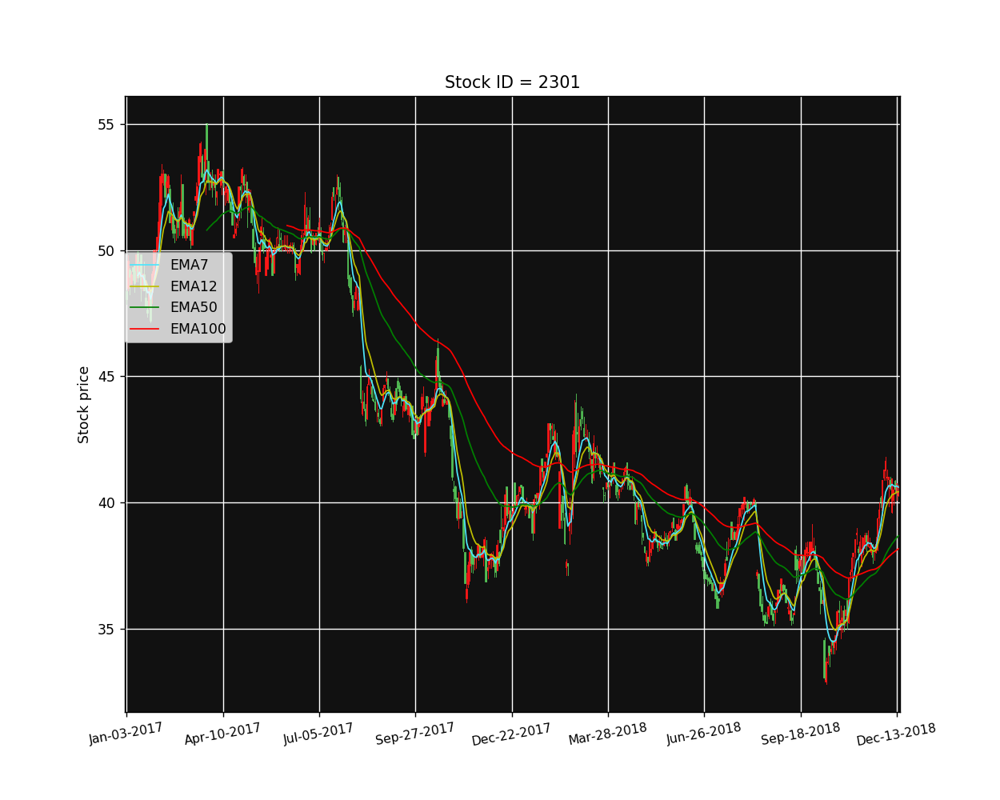

<IPython.core.display.Javascript object>


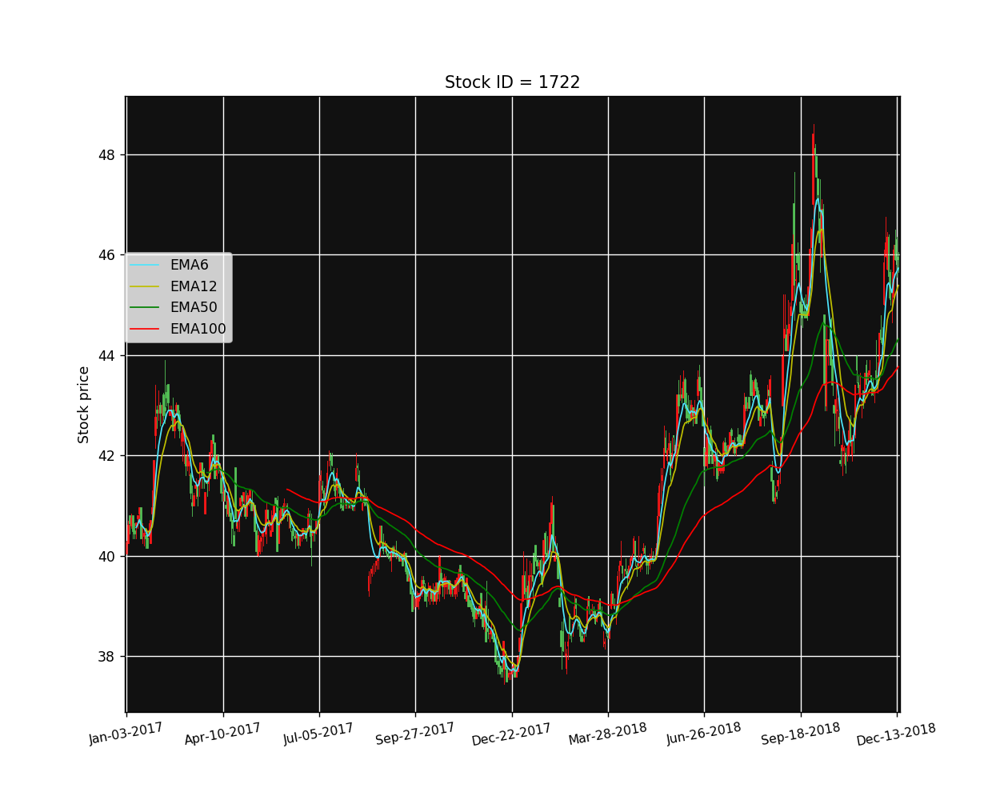

<IPython.core.display.Javascript object>


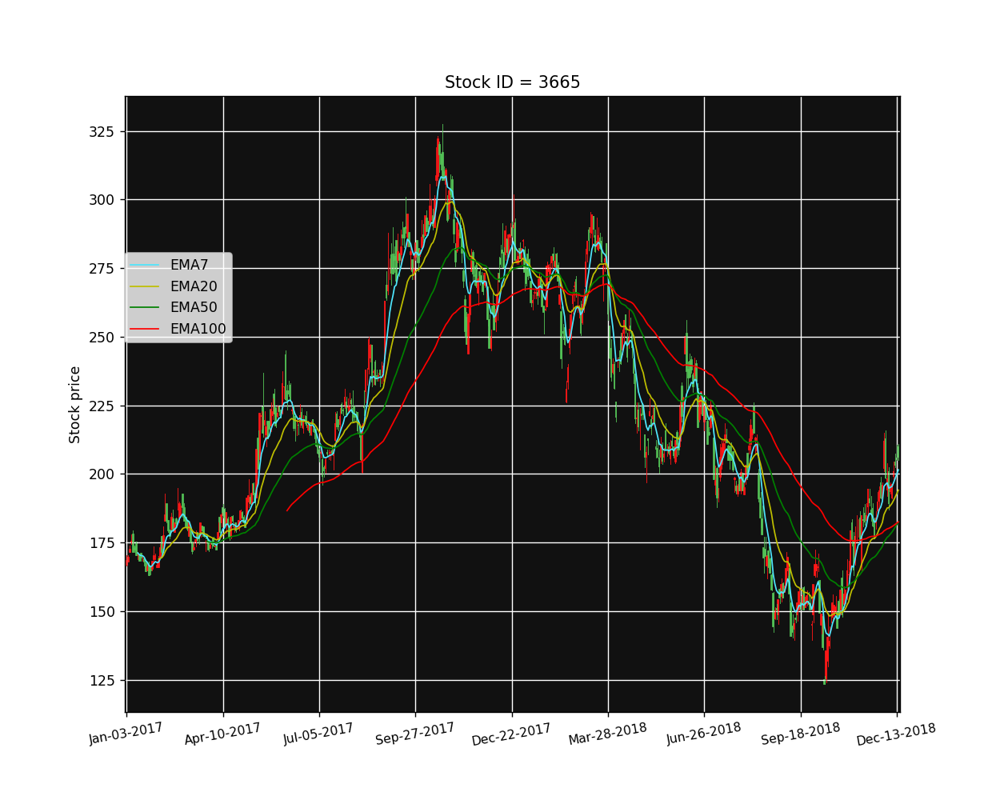

<IPython.core.display.Javascript object>


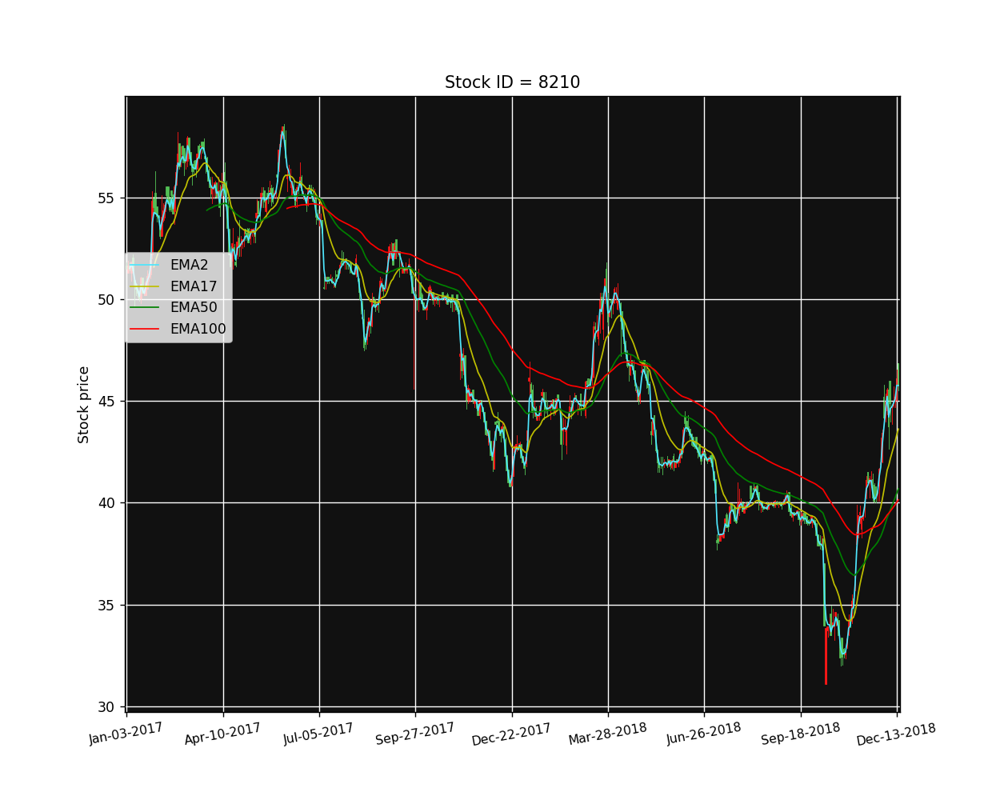

<IPython.core.display.Javascript object>


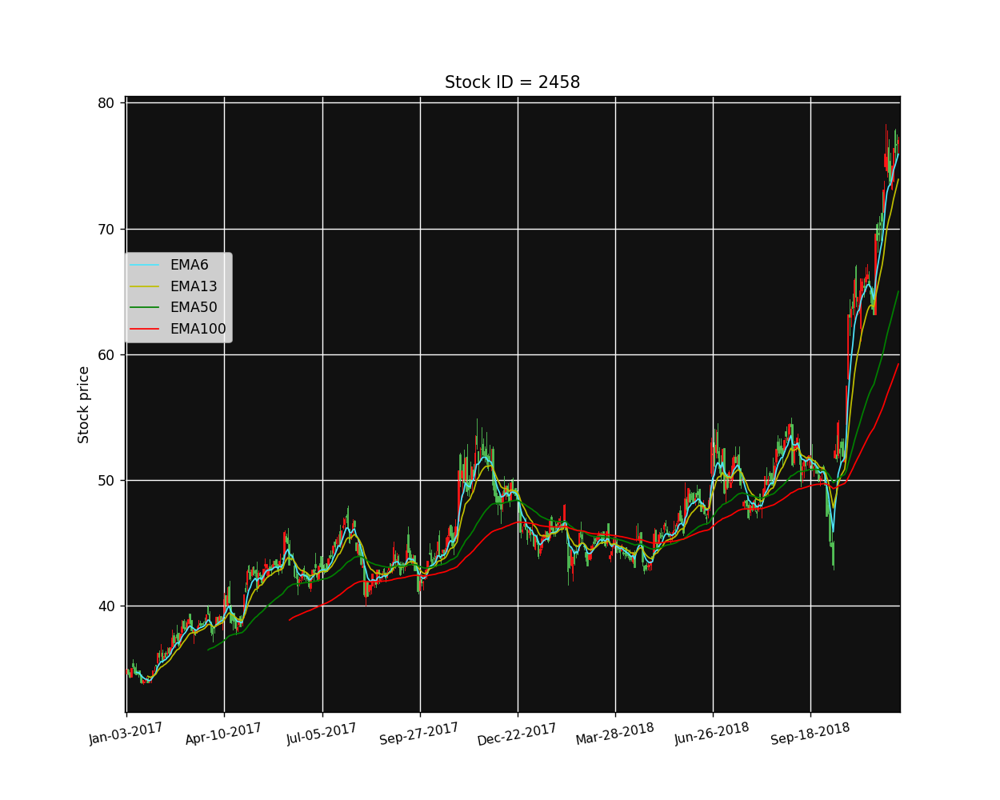

<IPython.core.display.Javascript object>


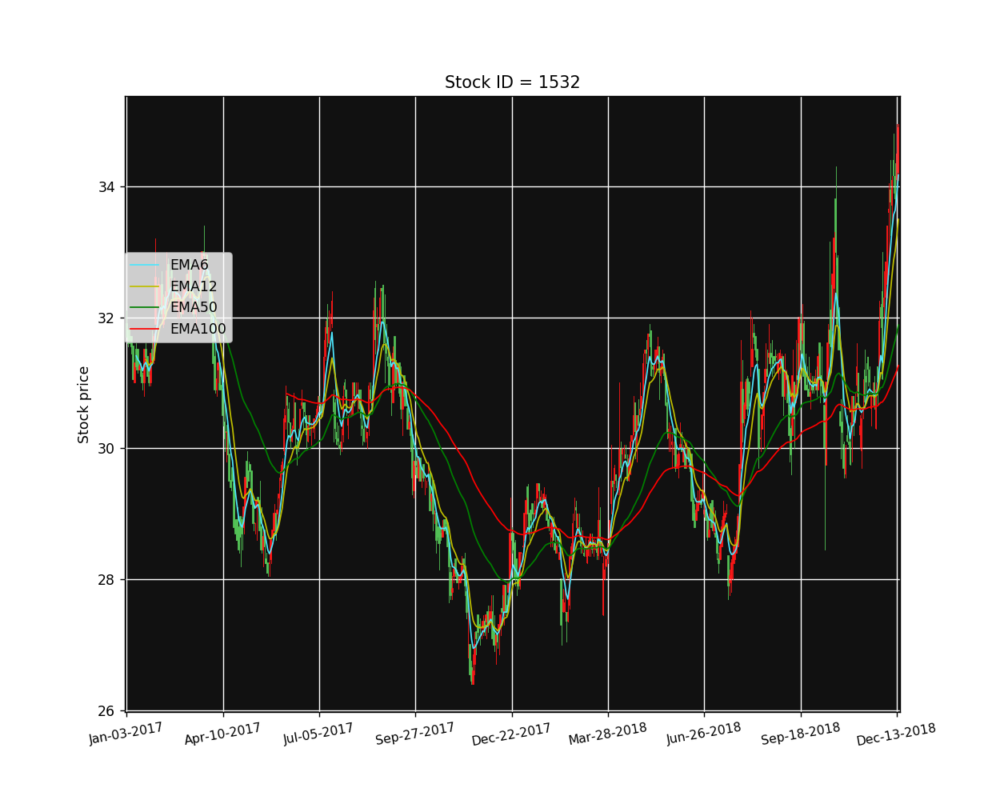

<IPython.core.display.Javascript object>


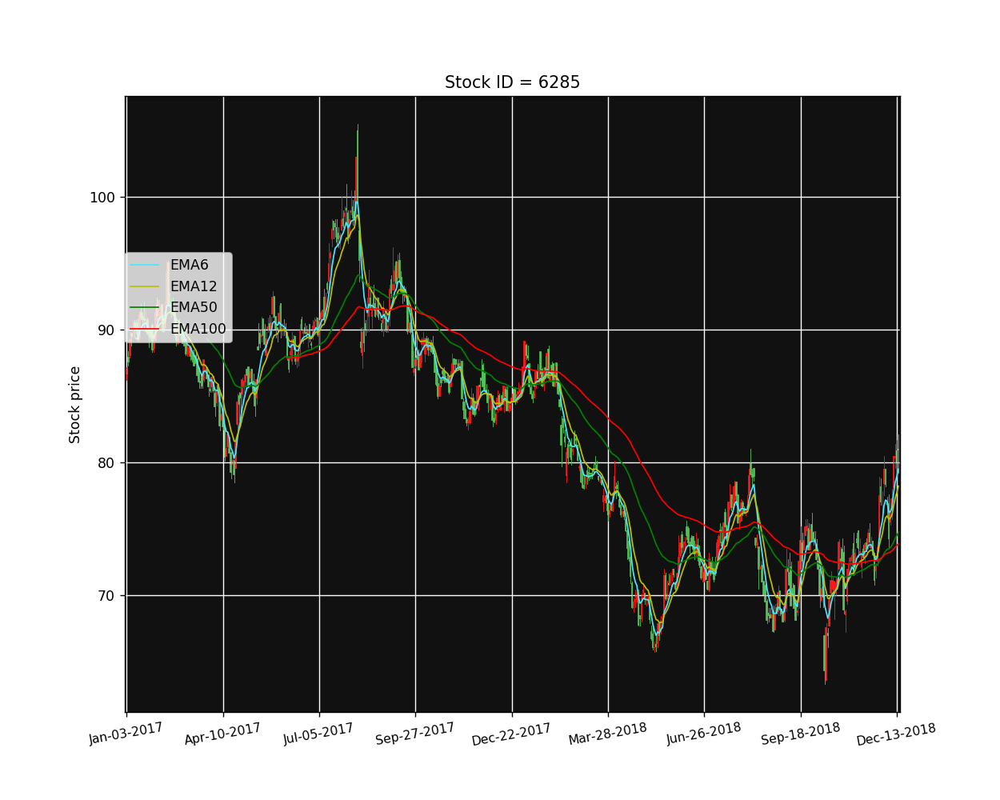

<IPython.core.display.Javascript object>


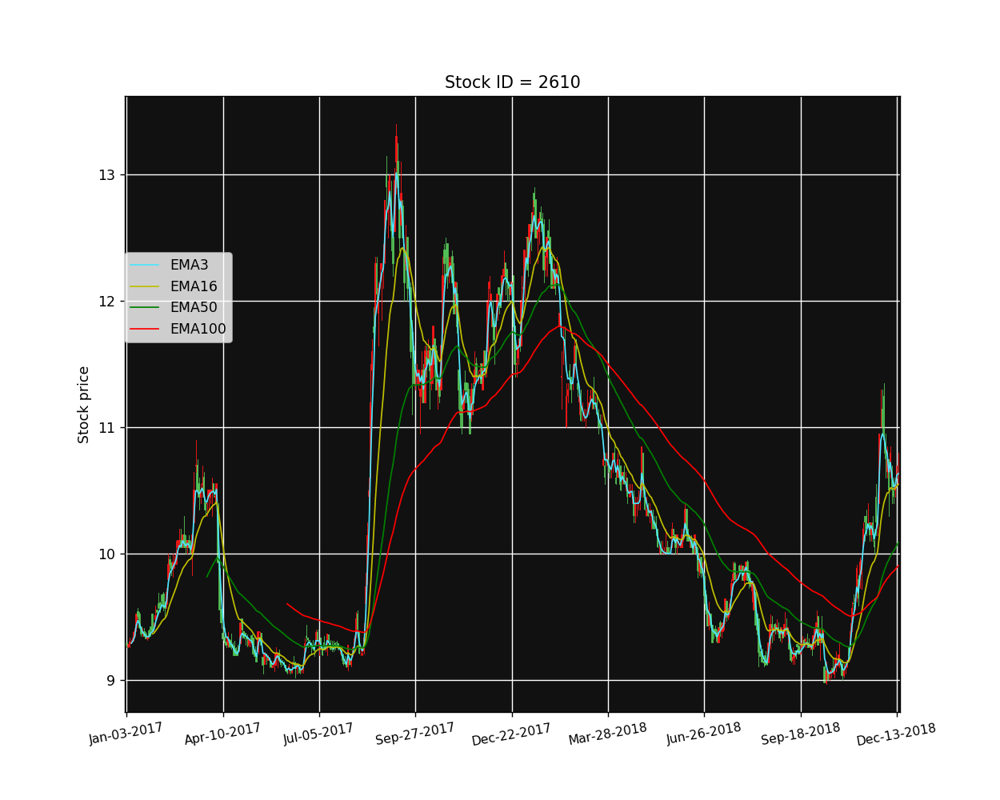

<IPython.core.display.Javascript object>


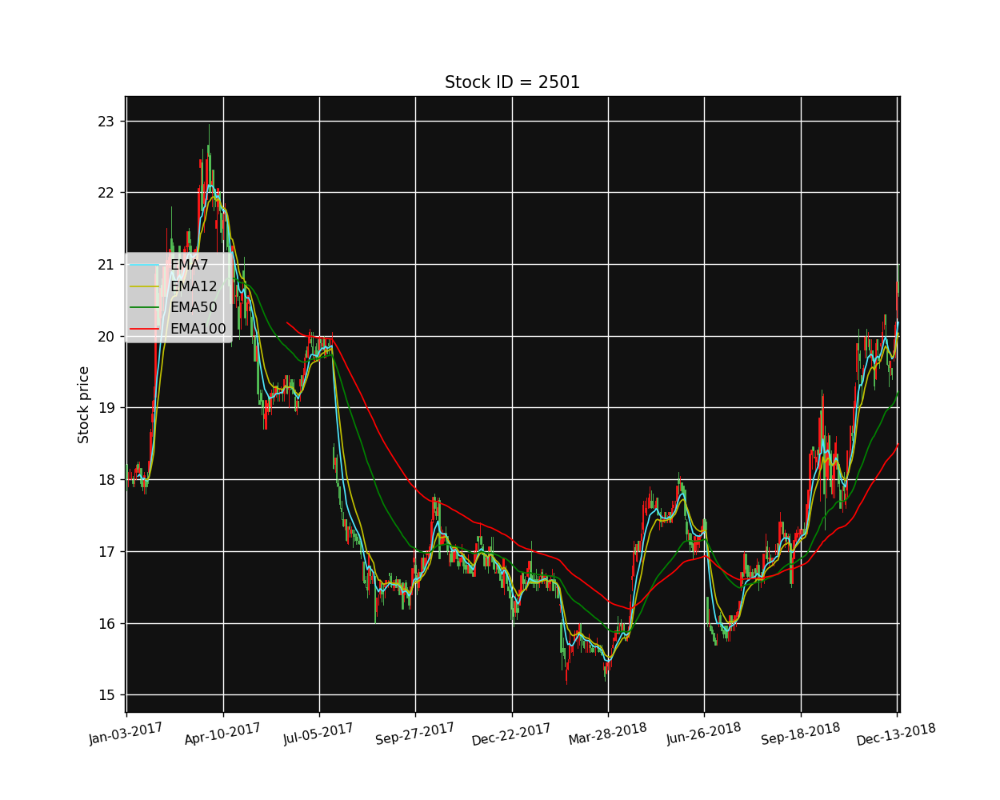

<IPython.core.display.Javascript object>


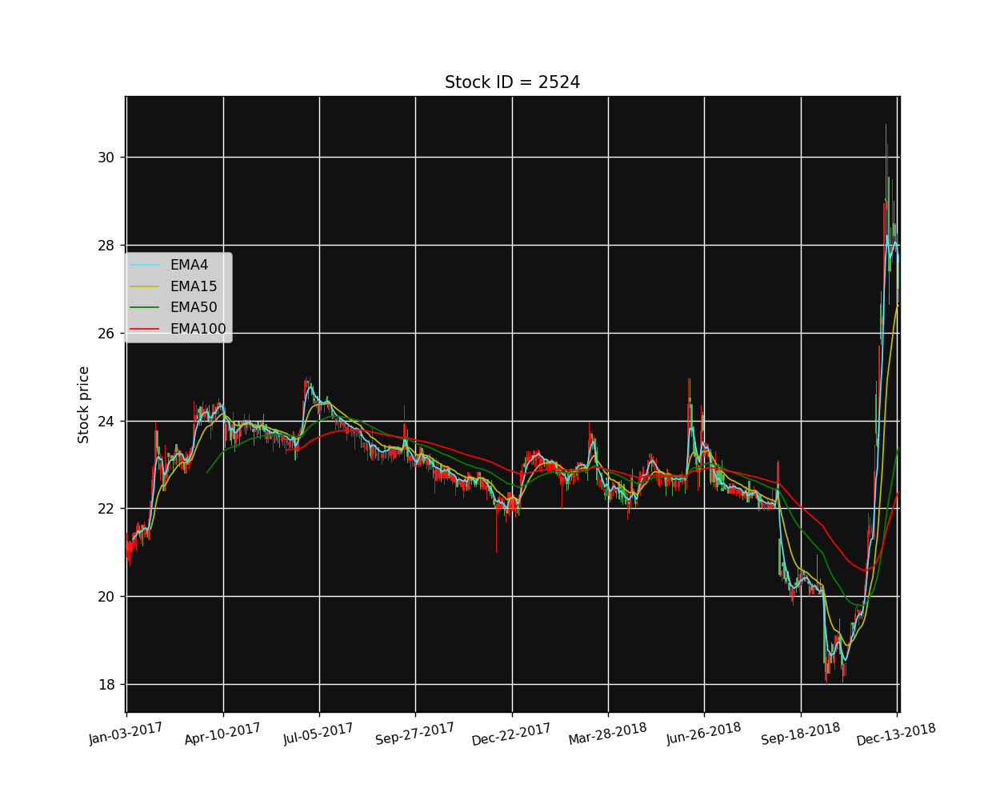

<IPython.core.display.Javascript object>


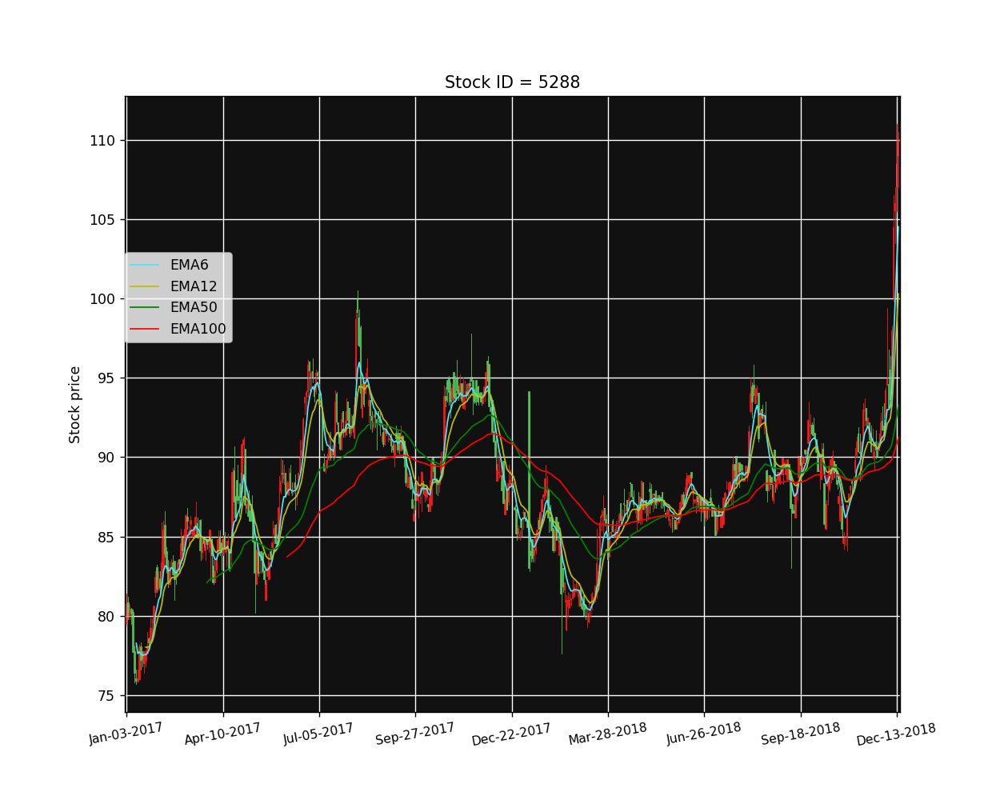

<IPython.core.display.Javascript object>


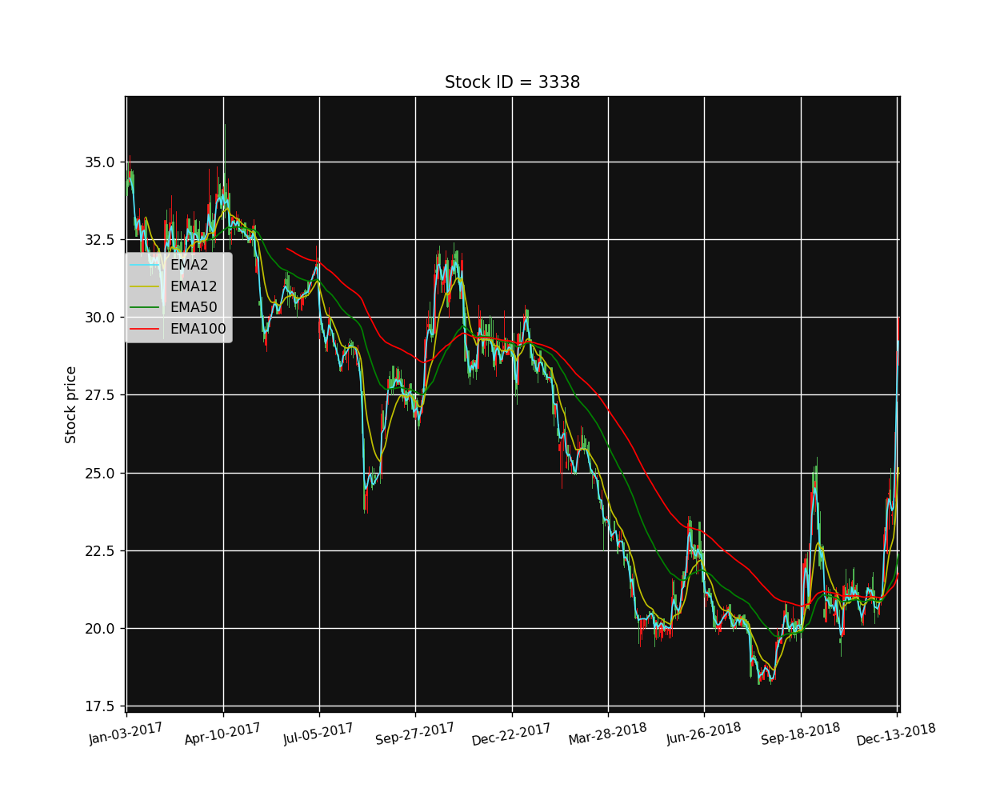

<IPython.core.display.Javascript object>


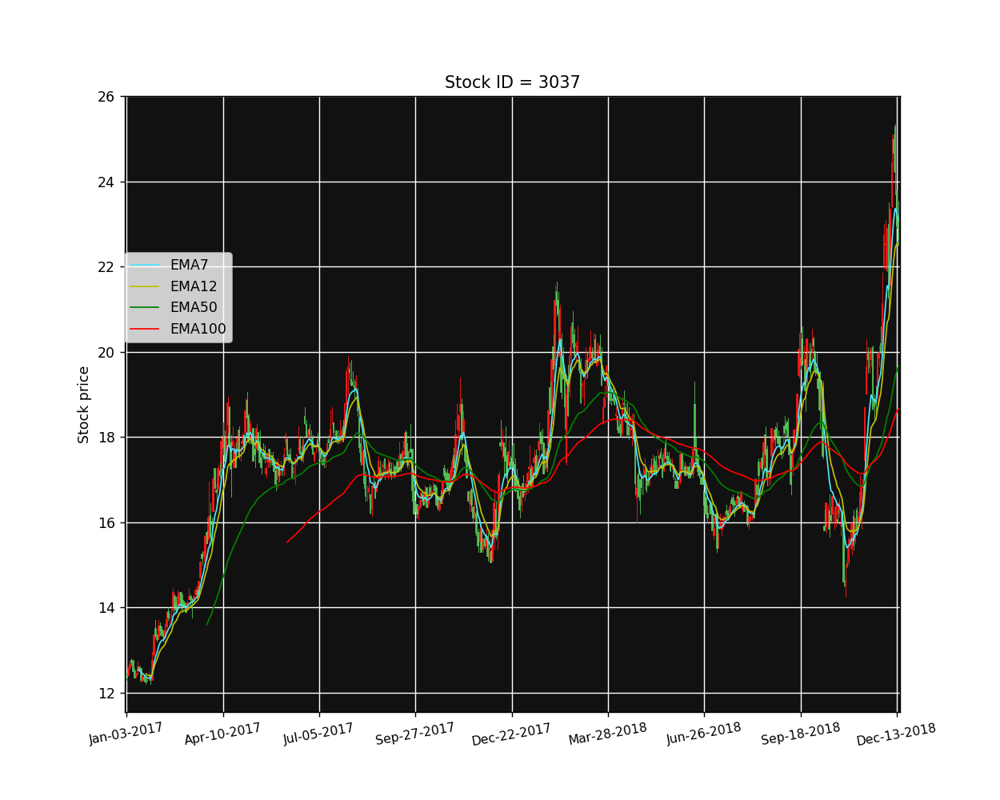

<IPython.core.display.Javascript object>


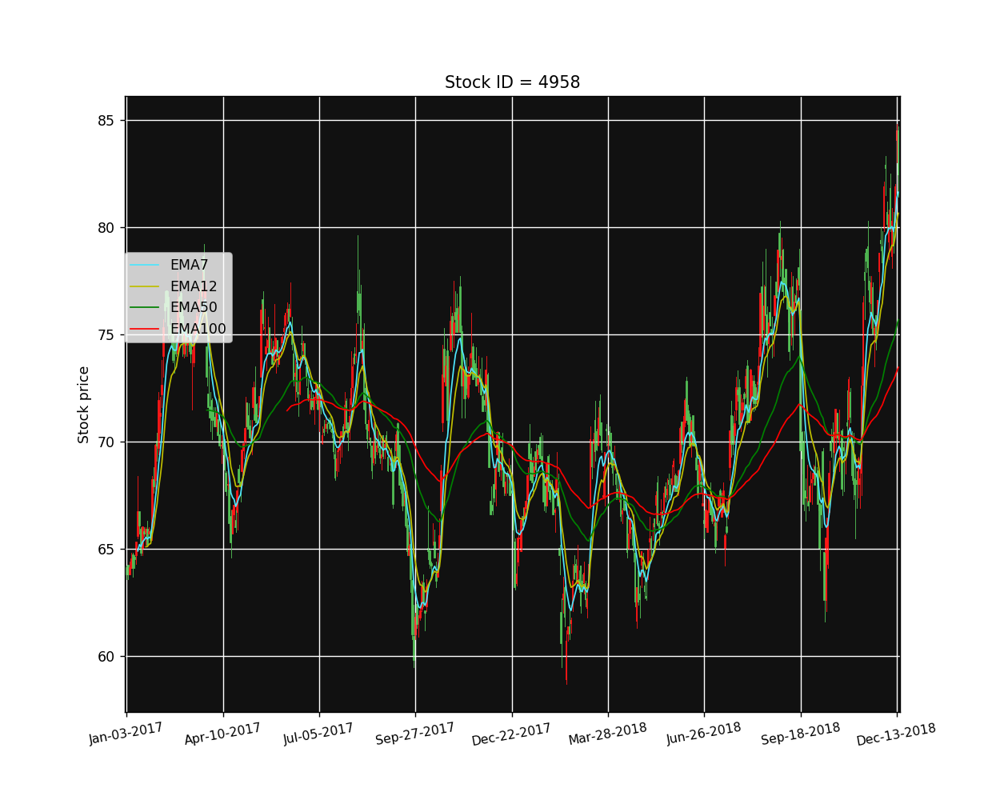

<IPython.core.display.Javascript object>


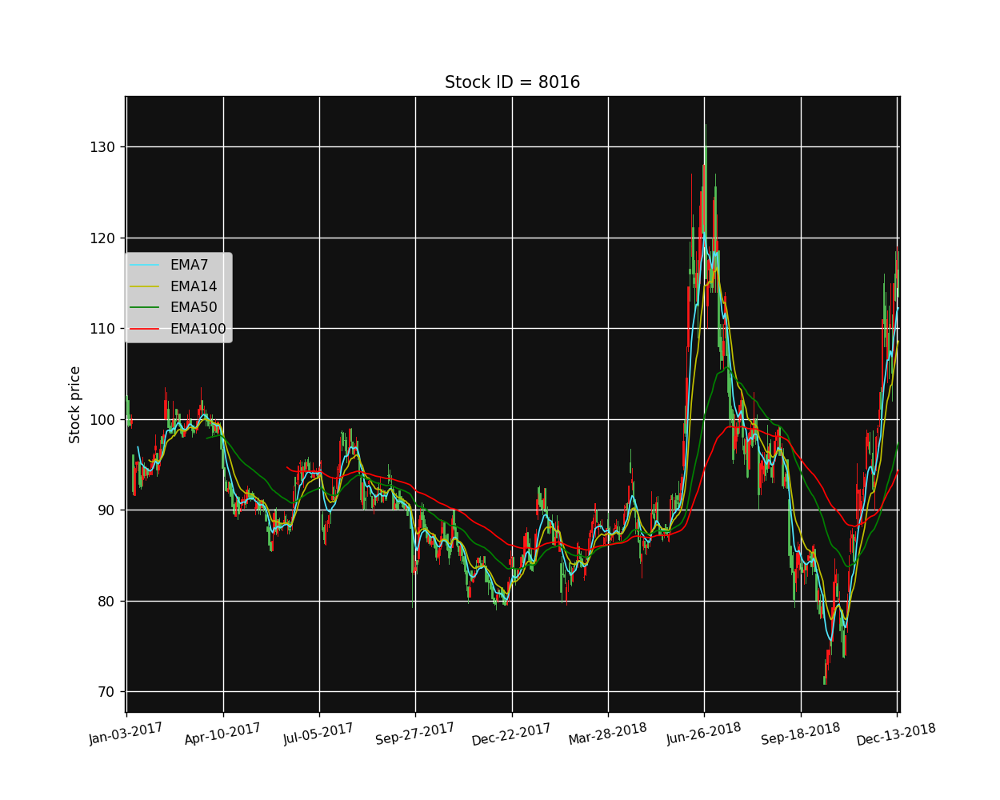

<IPython.core.display.Javascript object>


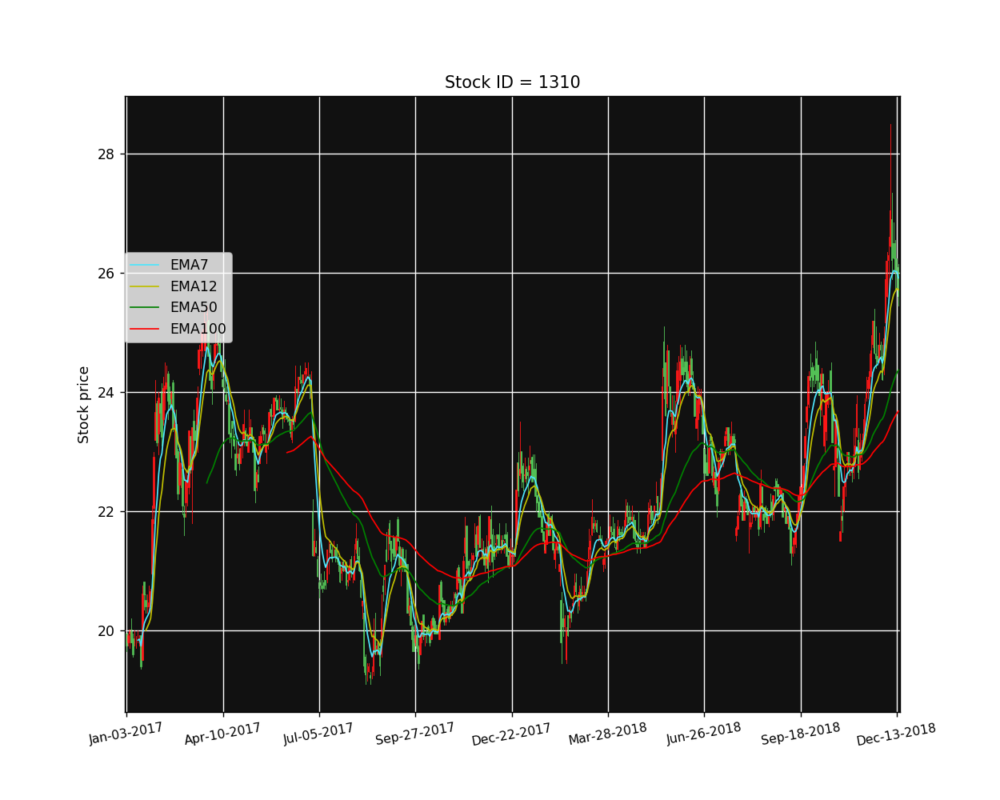

<IPython.core.display.Javascript object>


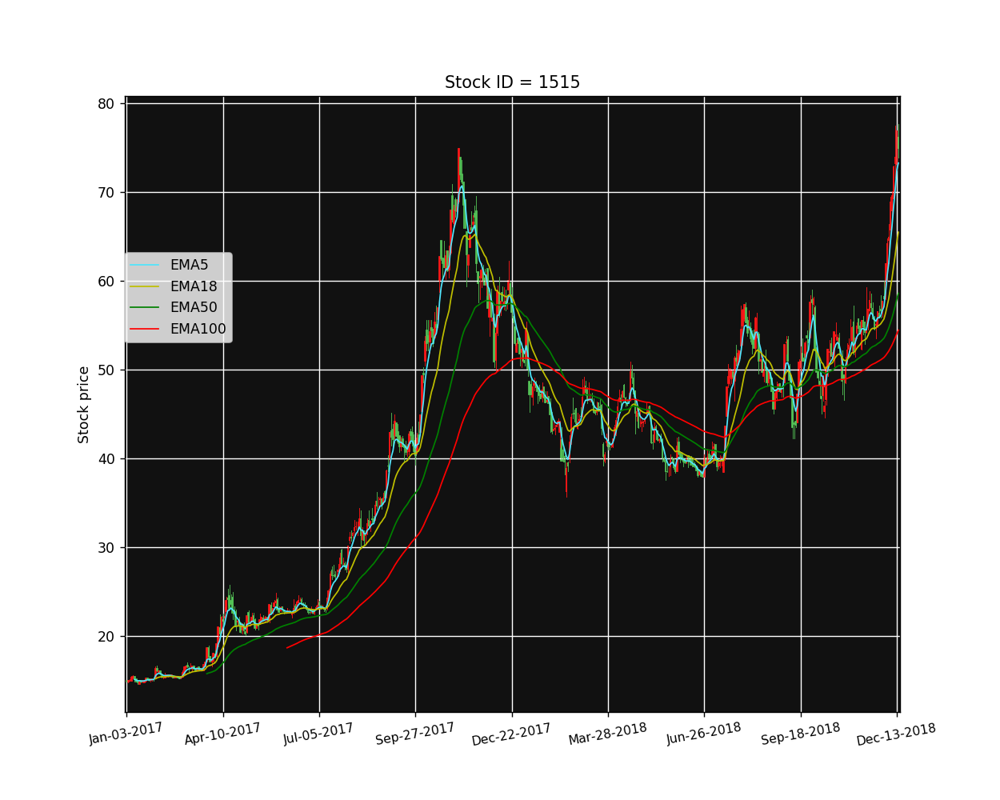

<IPython.core.display.Javascript object>


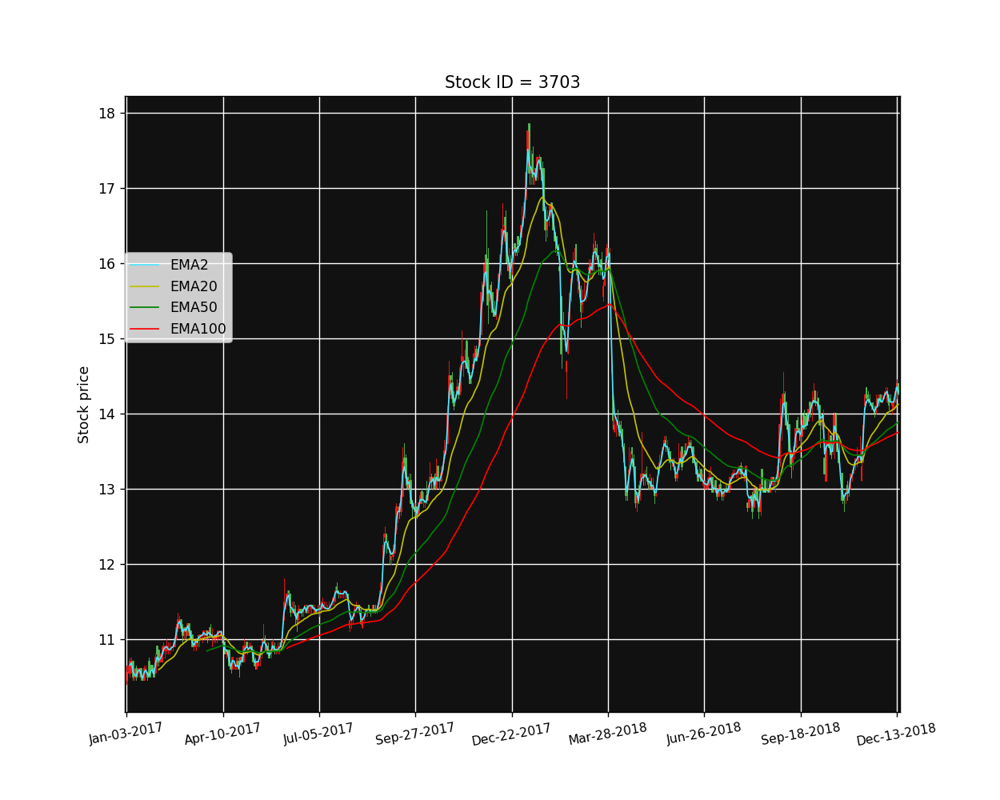

<IPython.core.display.Javascript object>


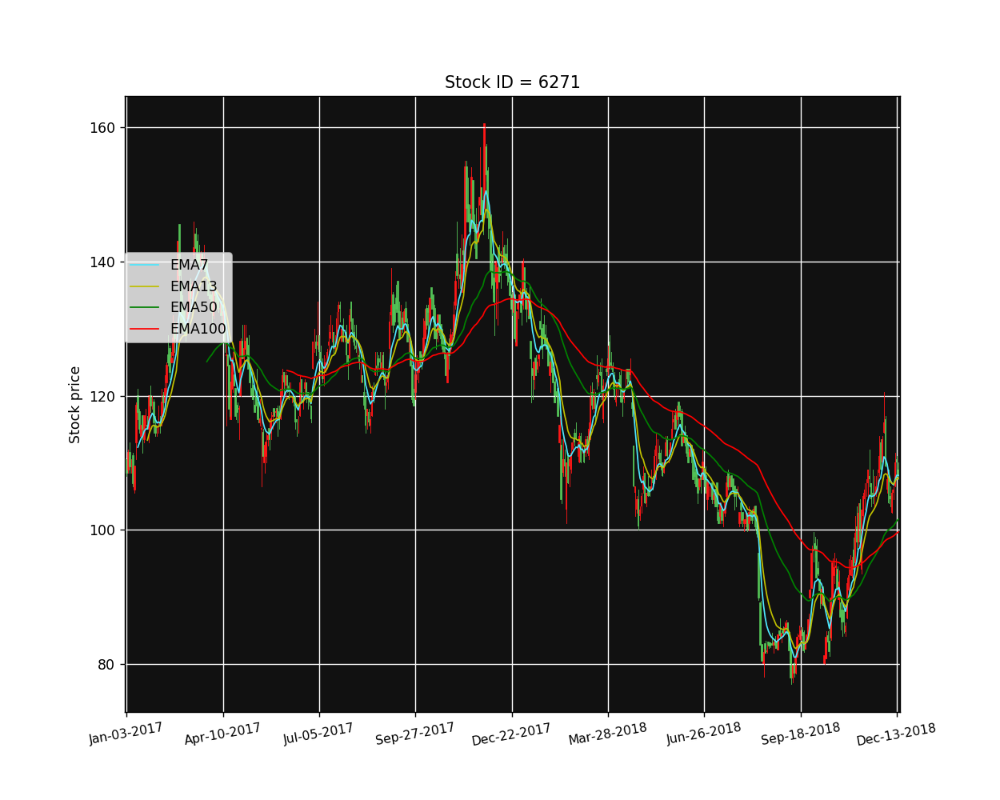

<IPython.core.display.Javascript object>


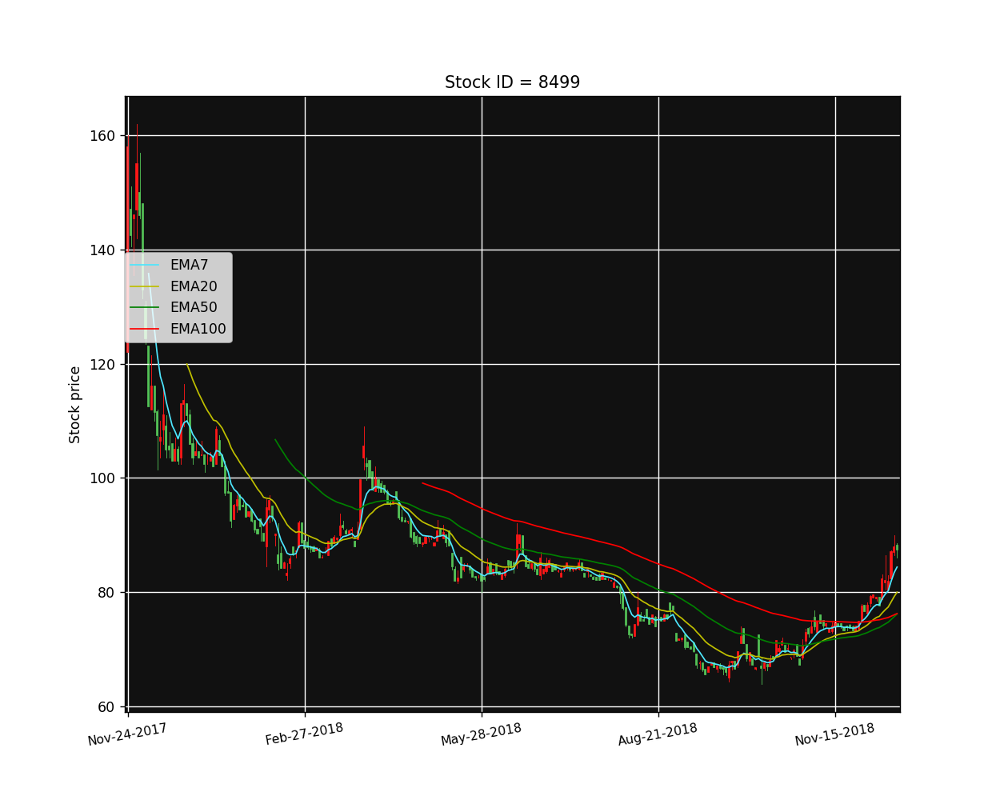

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


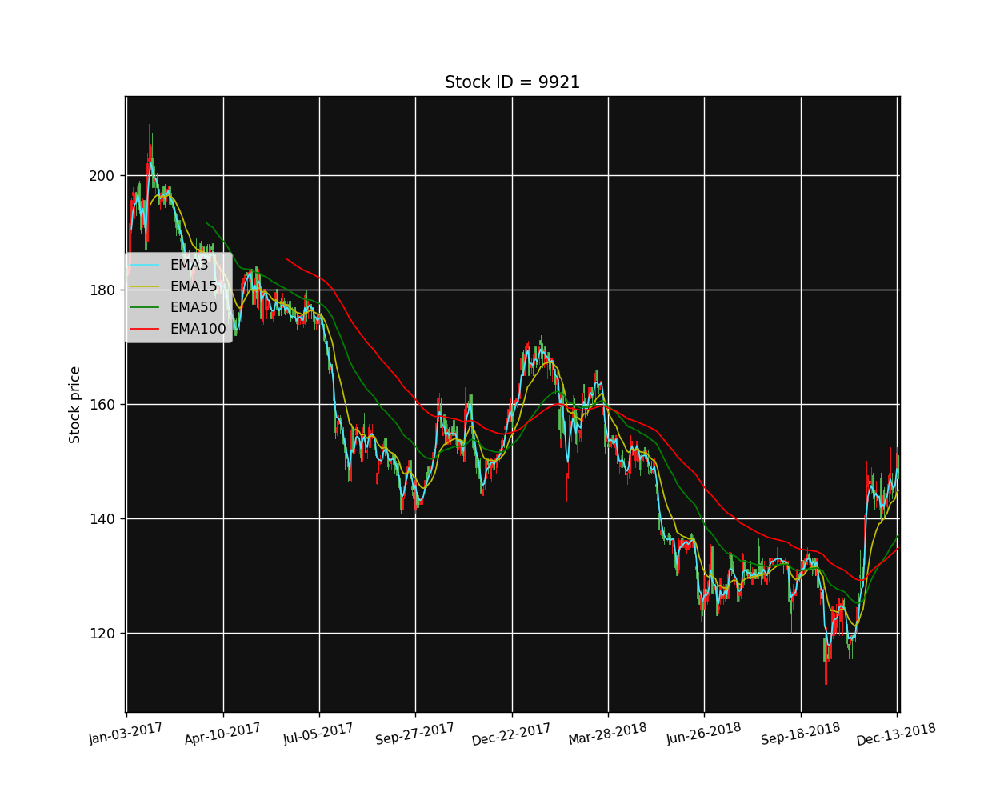

<IPython.core.display.Javascript object>


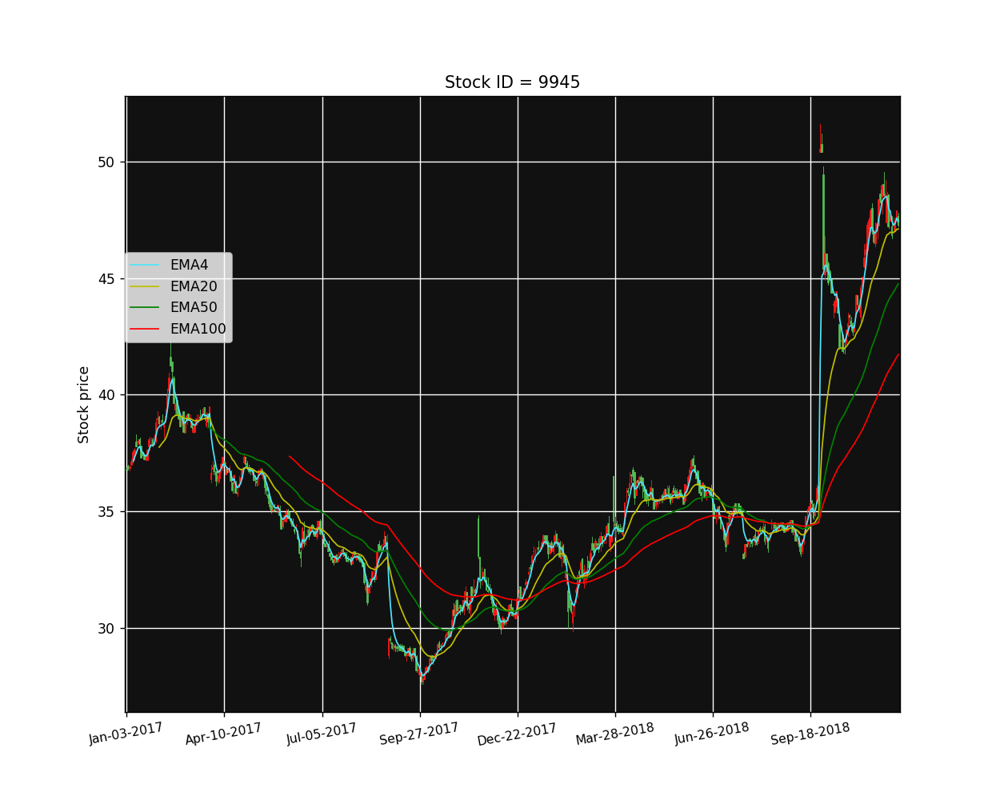

<IPython.core.display.Javascript object>


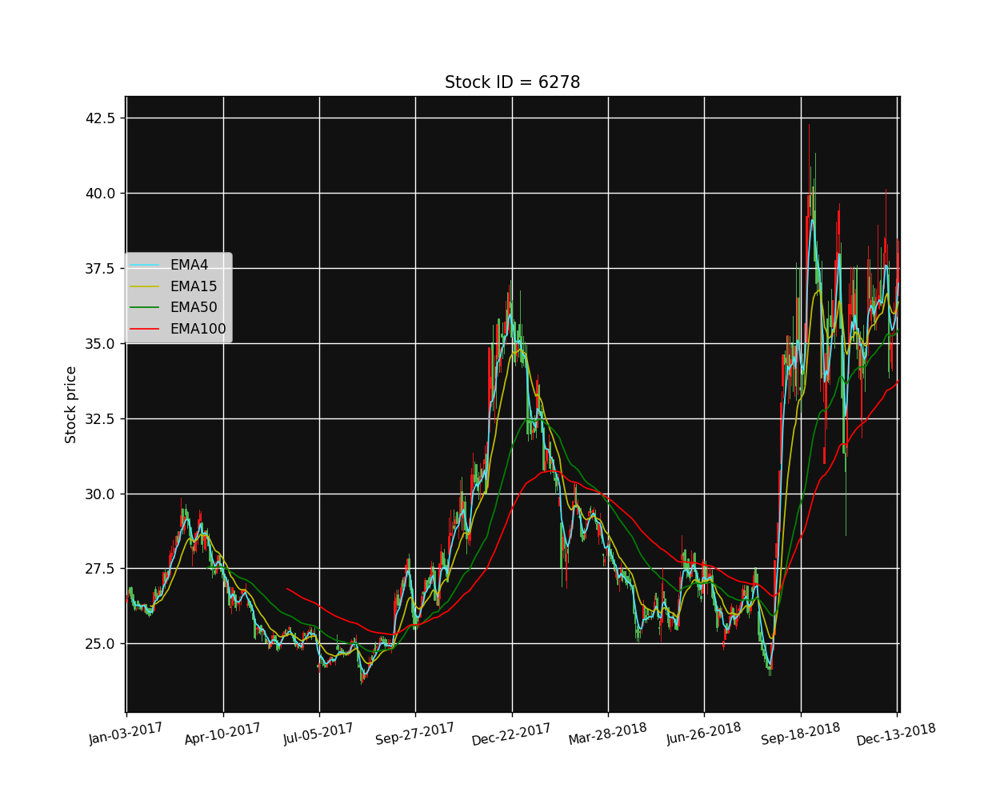

<IPython.core.display.Javascript object>


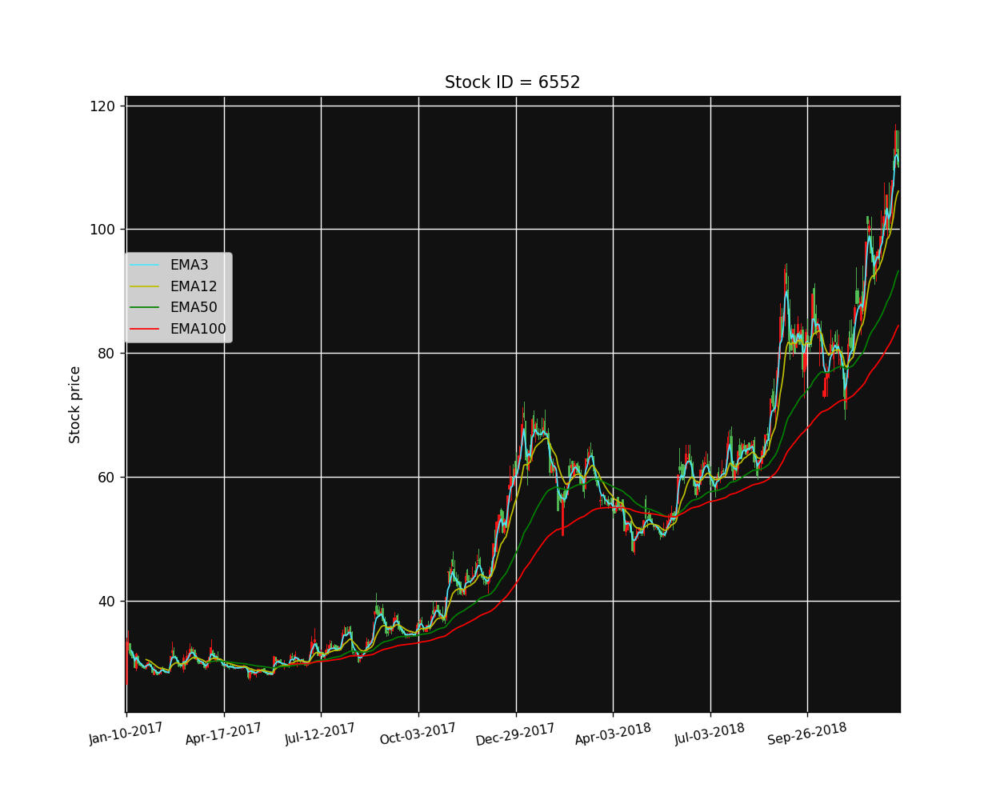

<IPython.core.display.Javascript object>


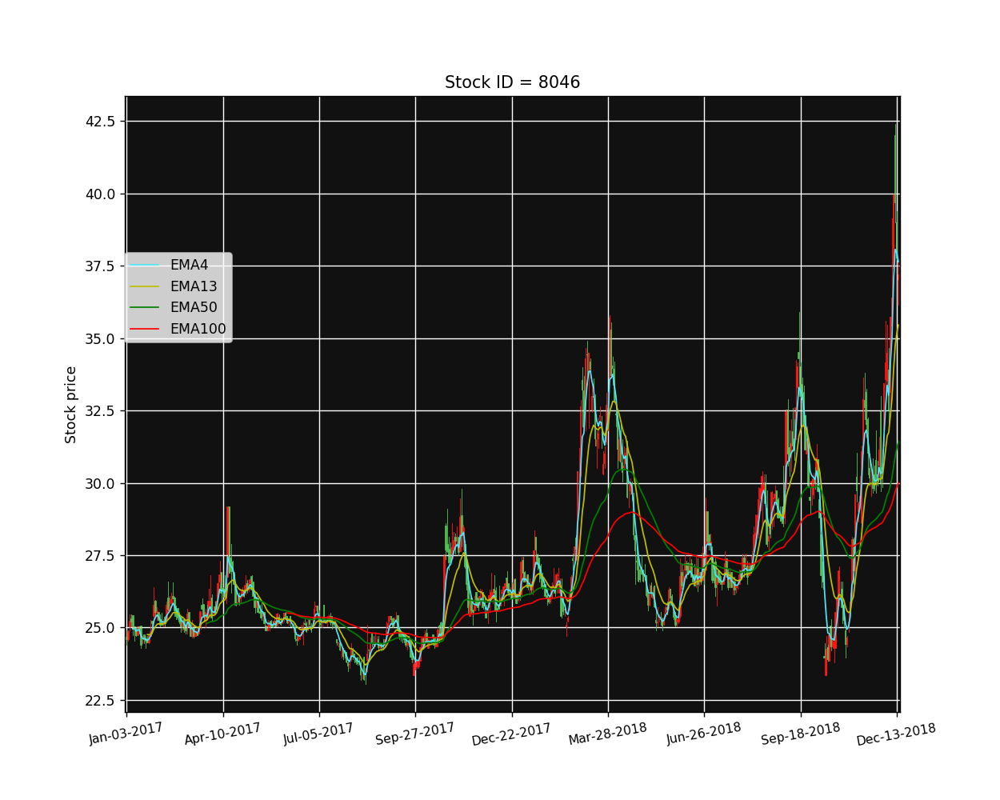

<IPython.core.display.Javascript object>


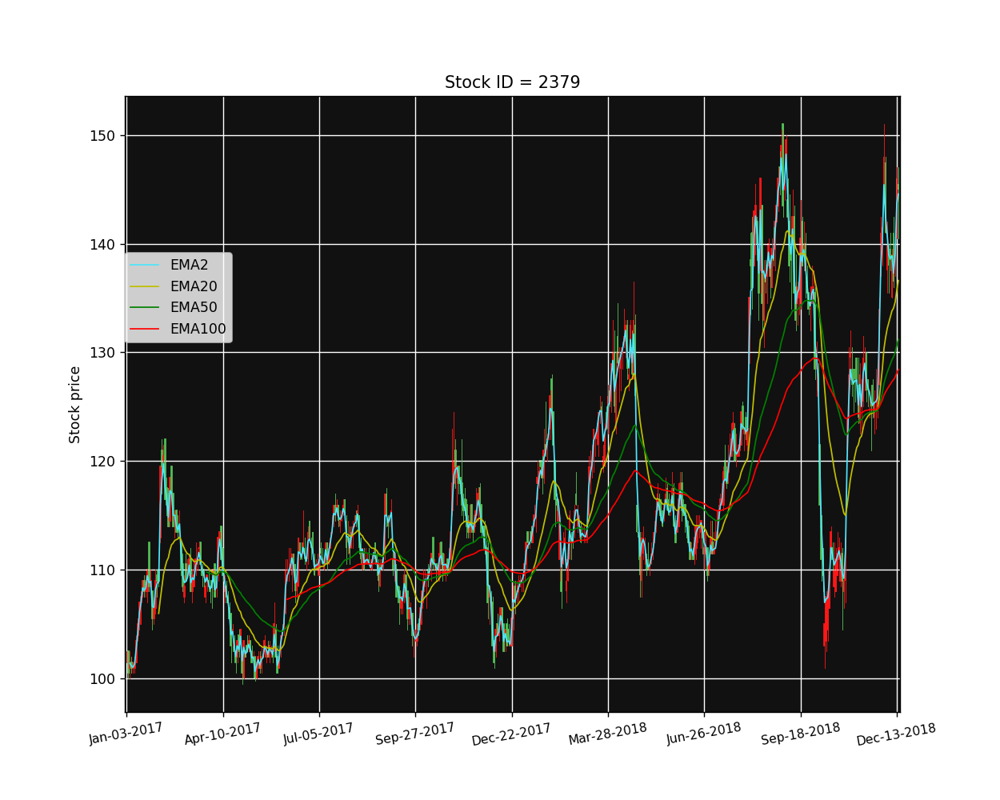

<IPython.core.display.Javascript object>


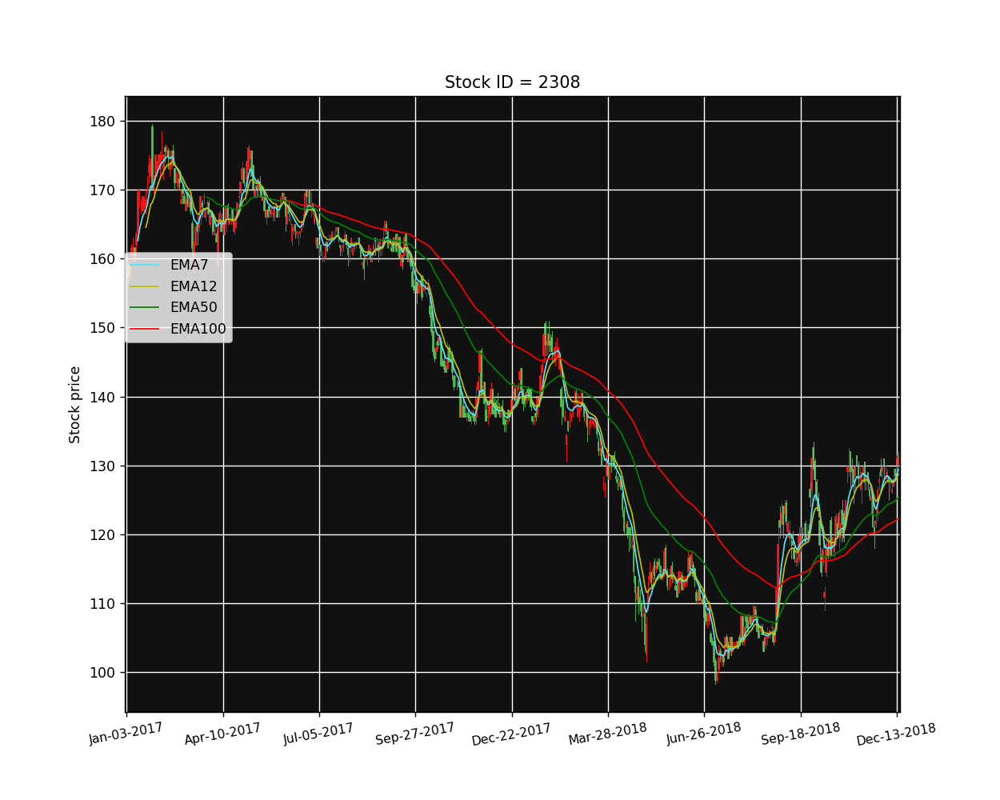

<IPython.core.display.Javascript object>


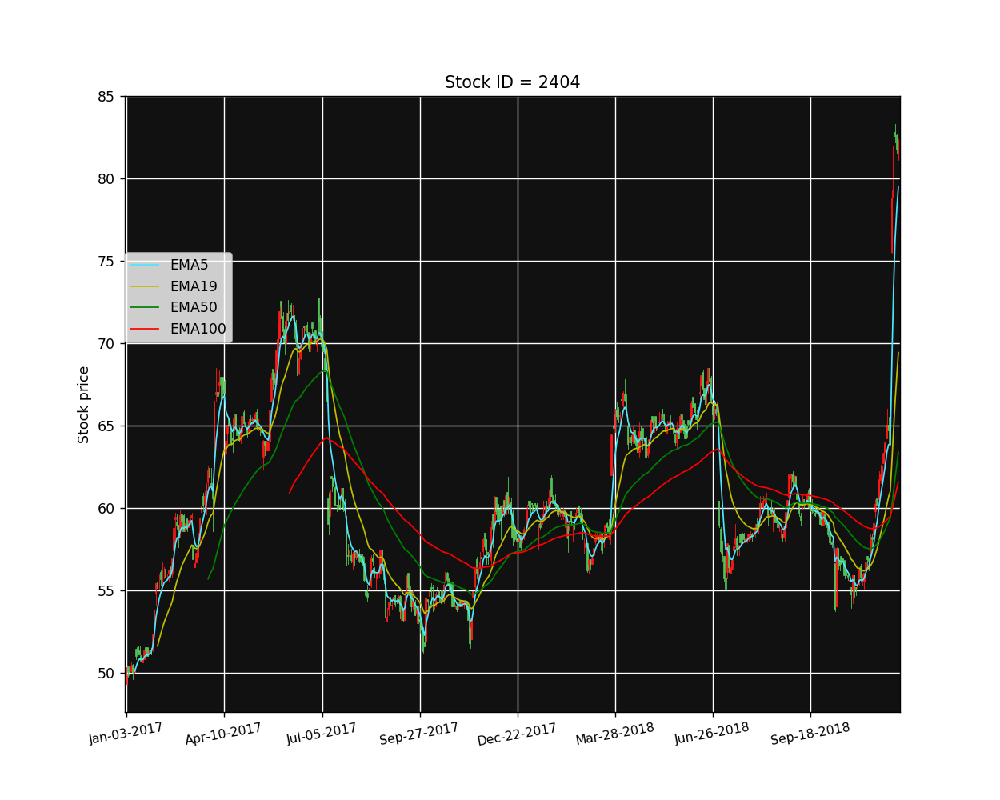

<IPython.core.display.Javascript object>


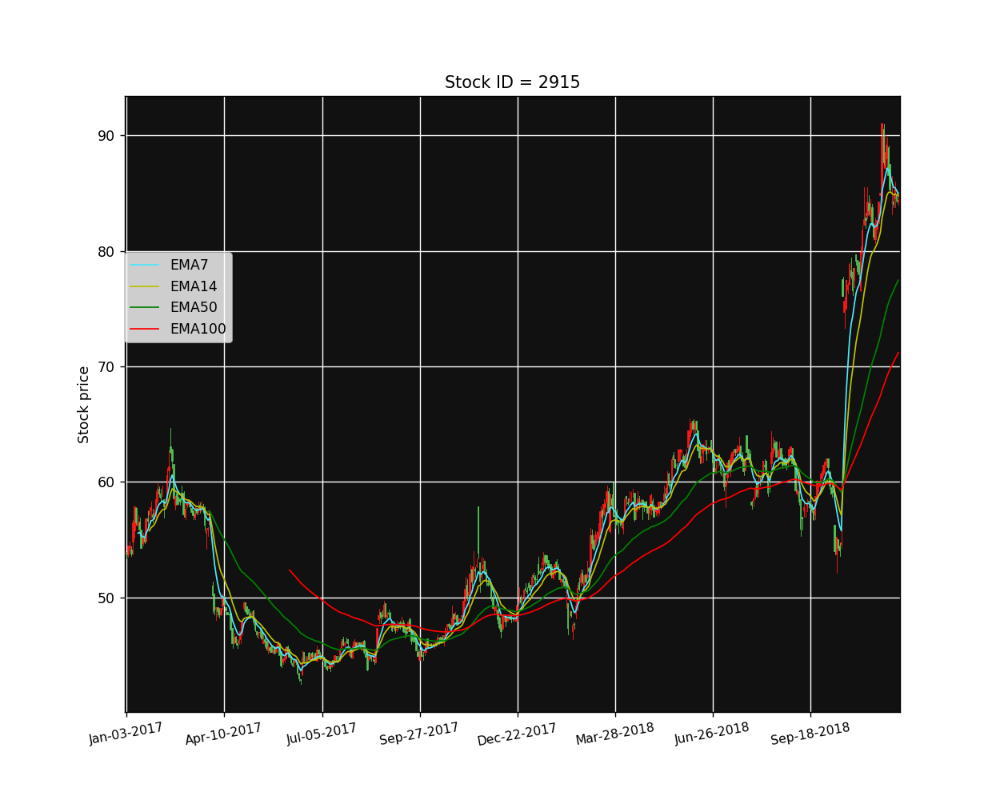

<IPython.core.display.Javascript object>


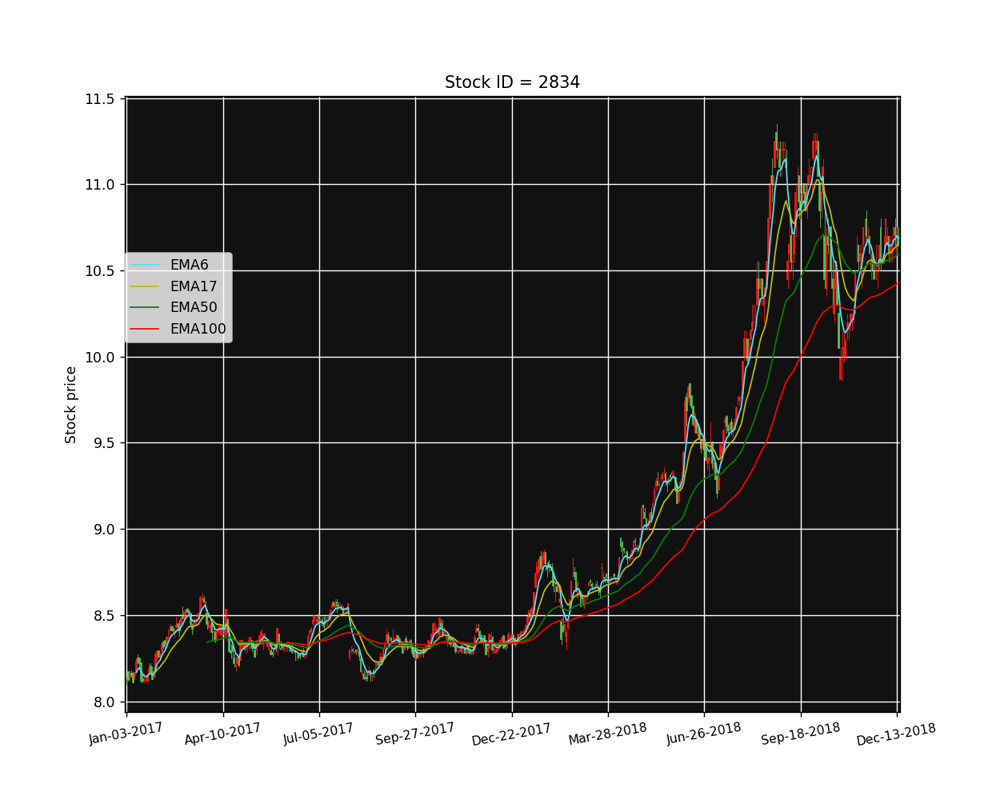

<IPython.core.display.Javascript object>


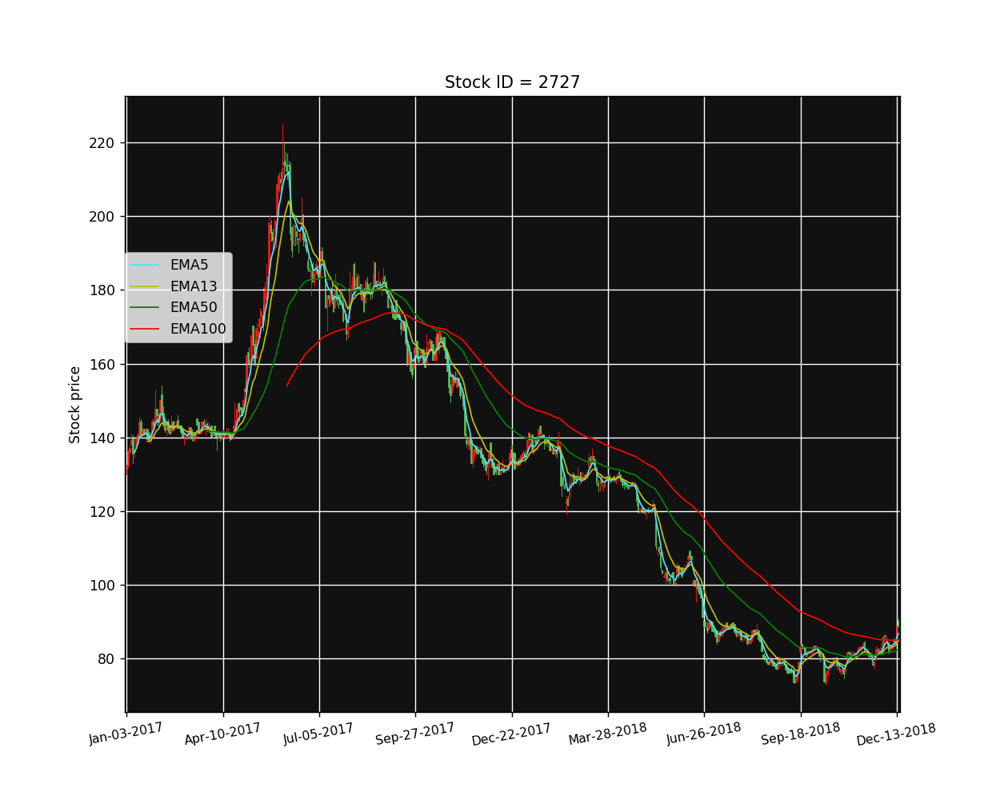

<IPython.core.display.Javascript object>


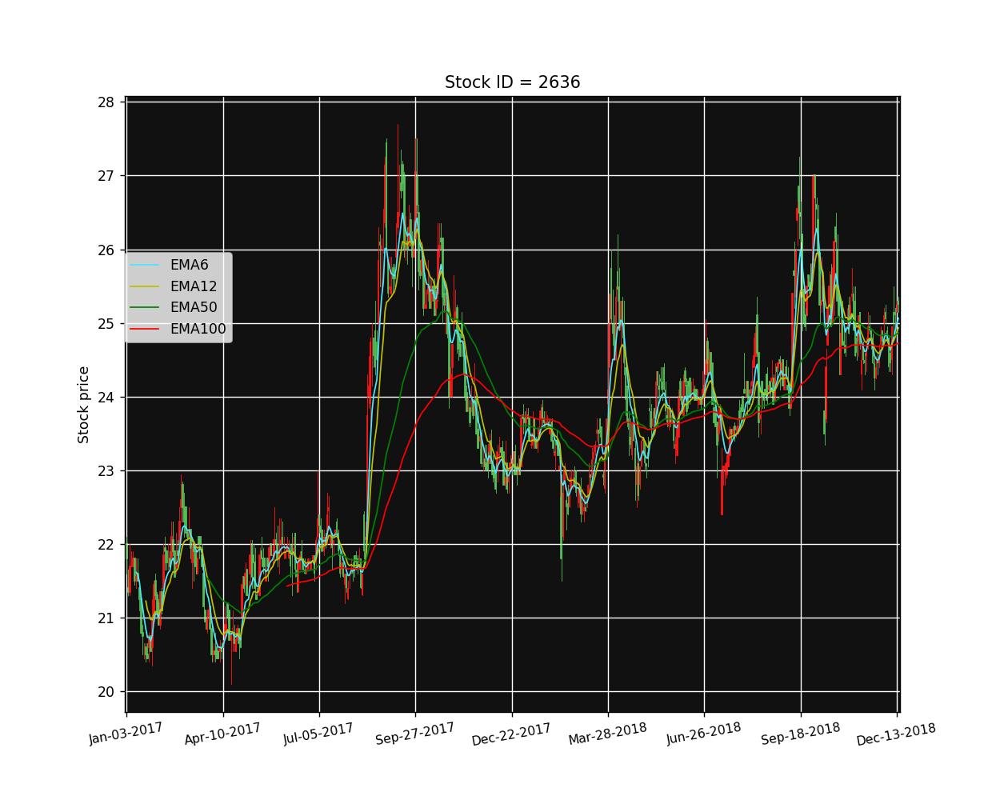

In [47]:
%matplotlib notebook
import matplotlib.dates as mdates
from mpl_finance import candlestick_ohlc
from matplotlib import ticker as mticker
from matplotlib.dates import DateFormatter, WeekdayLocator, DayLocator, MONDAY,YEARLY
from matplotlib.dates import MonthLocator,MONTHLY

def weekday_candlestick(ohlc_data, ax, fmt='%b-%d-%Y', freq=10, **kwargs):
# Wrapper function for matplotlib.finance.candlestick_ohlc that artificially spaces data to avoid gaps from weekends
    # Convert data to numpy array
    ohlc_data_arr = np.array(ohlc_data)[::-1]
    ohlc_data_arr2 = np.hstack([np.arange(ohlc_data_arr[:,0].size)[:,np.newaxis], ohlc_data_arr[:,1:]])
    ndays = ohlc_data_arr2[:,0]  # array([0, 1, 2, ... n-2, n-1, n])
    # Convert matplotlib date numbers to strings based on `fmt`
    dates = mdates.num2date(ohlc_data_arr[:,0])
    date_strings = []
    for date in dates:
        date_strings.append(date.strftime(fmt))
    # Plot candlestick chart
    candlestick_ohlc(ax, ohlc_data_arr2, **kwargs, colorup='#ff1717', colordown='#53c156')
    # Format x axis
    ax.set_xticks(ndays[::freq])
    ax.set_xticklabels(date_strings[::freq], rotation=10,fontsize=9)
    ax.set_xlim(ndays.min()-1, ndays.max()+1)
    plt.ylabel('Stock price')
    plt.show()

# Create figures and save them as JPEG files 
for i in range(len(res_list)):
    current_df = new_dataframe(backtest_df[i])
    fig = plt.figure(facecolor='w',figsize=(10,8))
    axes = fig.add_subplot(111,facecolor="#111111")
    axes.grid(True, color='w')
    weekday_candlestick(current_df, ax=axes, fmt='%b-%d-%Y', freq=60 ,width=0.3)
    # Set the plot titles
    axes.set_title("Stock ID = "+res_list[i])
    # add EMA5, EMA20, EMA50, EMA100
    av1 = np.array(current_df['收盤價'],dtype=float)[::-1]
    EMA_1 = roi_list[i][3]
    EMA_2 = roi_list[i][4]
    axes.plot(range(EMA_1,len(av1)),talib.EMA(av1,EMA_1)[-(len(av1)-EMA_1):],'#4ee6fd',label="EMA"+str(EMA_1), linewidth=1.0)
    axes.plot(range(EMA_2,len(av1)),talib.EMA(av1,EMA_2)[-(len(av1)-EMA_2):],'y',label="EMA"+str(EMA_2), linewidth=1.0)
    axes.plot(range(50,len(av1)),talib.EMA(av1,50)[-(len(av1)-50):],'g',label="EMA50", linewidth=1.0)
    axes.plot(range(100,len(av1)),talib.EMA(av1,100)[-(len(av1)-100):],'r',label="EMA100", linewidth=1.0)
    plt.legend(bbox_to_anchor=(0,0.6), loc=3, borderaxespad=0.)
    plt.savefig(res_list[i]+'.jpg')